## MLB Analysis
### Andrew Lujan
### MSDS 692- Practicum 1

This project will be an application of concepts learned through the Regis MSDS program. I'll be conducting an analysis on player performance and team performance that will be comprised of exploratory data analysis, machine learning, data visualization, and predictive modeling. The dataset was taken from Kaggle and more specifically Open Source Sports which has a fair amount of sports related datasets. The features of the dataset can be seen here: https://www.kaggle.com/open-source-sports/baseball-databank.

Some of the key questions that I'll be trying to answer throughout the course of this project are:

* How are some statistics in the batting table related to each other? 
* Is batting average a good predictor for power (HR)? Is runs? What about RBI's?
* What are the statistics most valuable to building a winning team?



### Import Packages

In [447]:
# Packages for Data Analysis and Data Wrangling

import pandas as pd
import numpy as np
import random as rnd

In [448]:
# Packages for Visualization
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

# Plotly(Interactive)
import plotly as py
import plotly.tools as tls
import plotly.graph_objs as go
import plotly.graph_objects as go
import plotly
import plotly as py
import plotly.figure_factory as ff
import plotly.offline as pyo
import plotly.graph_objs as go
from plotly.offline import init_notebook_mode, iplot
from IPython.display import HTML, Image
import plotly.express as px

# SKlearn

from sklearn.neighbors import KNeighborsRegressor
from sklearn.model_selection import train_test_split

init_notebook_mode(connected=True)
plotly.offline.init_notebook_mode(connected=True)
pyo.init_notebook_mode()



In [449]:
# Machine Learning Packages

# machine learning
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC, LinearSVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.linear_model import Perceptron
from sklearn.linear_model import SGDClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn import metrics

In [450]:
import warnings
warnings.filterwarnings("ignore")

### Import Data

In [451]:
batting = pd.read_csv("/Users/drewsdesktop/Desktop/Data Science/Regis Classes/MSDS 692- Practicum/Datasets/Baseball Databank/Batting.csv")
team = pd.read_csv("/Users/drewsdesktop/Desktop/Data Science/Regis Classes/MSDS 692- Practicum/Datasets/Baseball Databank/Teams.csv")

### Batting Data

This information will be used to determine whether or not position players have the statistics required to be an All Star or HOF player. 

In [452]:
batting.head()

,playerID,yearID,stint,teamID,lgID,G,AB,R,H,2B,...,RBI,SB,CS,BB,SO,IBB,HBP,SH,SF,GIDP
0,abercda01,1871,1,TRO,NaN,1,4.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN
1,addybo01,1871,1,RC1,NaN,25,118.0,30.0,32.0,6.0,...,13.0,8.0,1.0,4.0,0.0,NaN,NaN,NaN,NaN,NaN
2,allisar01,1871,1,CL1,NaN,29,137.0,28.0,40.0,4.0,...,19.0,3.0,1.0,2.0,5.0,NaN,NaN,NaN,NaN,NaN
3,allisdo01,1871,1,WS3,NaN,27,133.0,28.0,44.0,10.0,...,27.0,1.0,1.0,0.0,2.0,NaN,NaN,NaN,NaN,NaN
4,ansonca01,1871,1,RC1,NaN,25,120.0,29.0,39.0,11.0,...,16.0,6.0,2.0,2.0,1.0,NaN,NaN,NaN,NaN,NaN


In [453]:
batting.tail()

,playerID,yearID,stint,teamID,lgID,G,AB,R,H,2B,...,RBI,SB,CS,BB,SO,IBB,HBP,SH,SF,GIDP
101327,zitoba01,2015,1,OAK,AL,3,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
101328,zobribe01,2015,1,OAK,AL,67,235.0,39.0,63.0,20.0,...,33.0,1.0,1.0,33.0,26.0,2.0,0.0,0.0,3.0,5.0
101329,zobribe01,2015,2,KCA,AL,59,232.0,37.0,66.0,16.0,...,23.0,2.0,3.0,29.0,30.0,1.0,1.0,0.0,2.0,3.0
101330,zuninmi01,2015,1,SEA,AL,112,350.0,28.0,61.0,11.0,...,28.0,0.0,1.0,21.0,132.0,0.0,5.0,8.0,2.0,6.0
101331,zychto01,2015,1,SEA,AL,13,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


The first, I notice is that there are quite a few null values. Mainly in the following columns:
* lgID, IBB, HBP, SH, SF, GIDP

In [454]:
# General overview of null values, value type, column names. 
batting.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 101332 entries, 0 to 101331
Data columns (total 22 columns):
 #   Column    Non-Null Count   Dtype  
---  ------    --------------   -----  
 0   playerID  101332 non-null  object 
 1   yearID    101332 non-null  int64  
 2   stint     101332 non-null  int64  
 3   teamID    101332 non-null  object 
 4   lgID      100595 non-null  object 
 5   G         101332 non-null  int64  
 6   AB        96183 non-null   float64
 7   R         96183 non-null   float64
 8   H         96183 non-null   float64
 9   2B        96183 non-null   float64
 10  3B        96183 non-null   float64
 11  HR        96183 non-null   float64
 12  RBI       95759 non-null   float64
 13  SB        94883 non-null   float64
 14  CS        72729 non-null   float64
 15  BB        96183 non-null   float64
 16  SO        88345 non-null   float64
 17  IBB       59620 non-null   float64
 18  HBP       93373 non-null   float64
 19  SH        89845 non-null   float64
 20  SF  

In [455]:
batting.describe()

,yearID,stint,G,AB,R,H,2B,3B,HR,RBI,SB,CS,BB,SO,IBB,HBP,SH,SF,GIDP
count,101332.000000,101332.000000,101332.000000,96183.000000,96183.000000,96183.000000,96183.000000,96183.000000,96183.000000,95759.000000,94883.000000,72729.000000,96183.000000,88345.000000,59620.000000,93373.000000,89845.000000,60151.000000,70075.000000
mean,1963.506533,1.077567,51.400111,149.970327,19.887038,39.261647,6.637067,1.373361,2.949305,17.965163,3.158184,1.324025,13.811484,21.629849,1.213234,1.113395,2.457900,1.150122,3.210032
std,38.628278,0.283676,47.145273,186.557072,28.671365,53.310941,9.801563,2.710547,6.409662,26.756514,7.922994,2.838196,21.092775,28.432978,2.894918,2.320660,4.347818,2.023981,4.835881
min,1871.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,1933.000000,1.000000,13.000000,7.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,1972.000000,1.000000,34.000000,57.000000,5.000000,11.000000,1.000000,0.000000,0.000000,4.000000,0.000000,0.000000,3.000000,10.000000,0.000000,0.000000,1.000000,0.000000,1.000000
75%,1997.000000,1.000000,80.250000,251.000000,30.000000,63.000000,10.000000,2.000000,3.000000,27.000000,2.000000,1.000000,20.000000,30.000000,1.000000,1.000000,3.000000,2.000000,5.000000
max,2015.000000,5.000000,165.000000,716.000000,192.000000,262.000000,67.000000,36.000000,73.000000,191.000000,138.000000,42.000000,232.000000,223.000000,120.000000,51.000000,67.000000,19.000000,36.000000


Using the info table I can see that there are quite a few categories that have null values. Most of the information I want from this dataset is statistical information. I don't think there'll be much value in knowing the league information, the year, the team, and stint. The games may be a source for filtering. I'll continue looking at the other data that I've read in. 

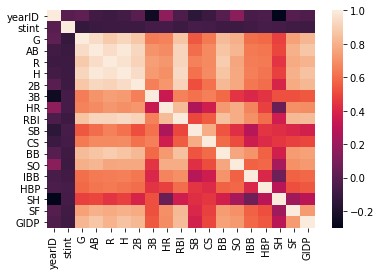

In [456]:
# Heatmap of Batting dataset
_ = sns.heatmap(batting.corr())

### Batting Cleaning

I wanted to use information that was relevant to me. I was born in 1989, so I want to make predictions based on players that I've seen in my lifetime. I thought that 1990 was a nice round number to cut-off my evaluation at. 

In [457]:
batting_updated = batting[batting['yearID'] >= 1990]
batting_updated.info()


<class 'pandas.core.frame.DataFrame'>
Int64Index: 33924 entries, 67408 to 101331
Data columns (total 22 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   playerID  33924 non-null  object 
 1   yearID    33924 non-null  int64  
 2   stint     33924 non-null  int64  
 3   teamID    33924 non-null  object 
 4   lgID      33924 non-null  object 
 5   G         33924 non-null  int64  
 6   AB        31875 non-null  float64
 7   R         31875 non-null  float64
 8   H         31875 non-null  float64
 9   2B        31875 non-null  float64
 10  3B        31875 non-null  float64
 11  HR        31875 non-null  float64
 12  RBI       31875 non-null  float64
 13  SB        31875 non-null  float64
 14  CS        31875 non-null  float64
 15  BB        31875 non-null  float64
 16  SO        31875 non-null  float64
 17  IBB       31875 non-null  float64
 18  HBP       31875 non-null  float64
 19  SH        31875 non-null  float64
 20  SF        31875 non-nul

As you can see the information is almost uniform. It looks like the actual statistical game metrics are only a bit off in values. However, in comparison to each other they are uniform. They all have 31,875 as a value. I'm going to see if this is null information. 

In [458]:
batting_updated.head()

,playerID,yearID,stint,teamID,lgID,G,AB,R,H,2B,...,RBI,SB,CS,BB,SO,IBB,HBP,SH,SF,GIDP
67408,aasedo01,1990,1,LAN,NL,32,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
67409,abbotji01,1990,1,CAL,AL,33,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
67410,abbotpa01,1990,1,MIN,AL,7,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
67411,abnersh01,1990,1,SDN,NL,91,184.0,17.0,45.0,9.0,...,15.0,2.0,3.0,9.0,28.0,1.0,2.0,2.0,1.0,3.0
67412,ackerji01,1990,1,TOR,AL,59,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


Looking at the information above I can see why some of these values are null now. I believe it has to do with the fact that American League pitchers aren't able to actually have at bats there is a rule where a player is designated to hit for the pitcher in the American league. This means that someone else collects the at-bats that a pitcher would actually be collecting. Let's Looking at Jim Acker and Jim Abbot's batting information I see a bunch of null values for hitting. What I'm going to do is replace those values with 0's since they actually accrued zero ab's according to baseball reference: https://www.baseball-reference.com/players/a/ackerji01.shtml

I don't believe this is a major issue because pitcher's don't make it into the HOF or All-Star game based on their batting statistics. 

In [459]:
# Filling American League Pitcher's null hitting values with 0's. 

batting_fill = batting_updated.fillna(0)
batting_fill.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 33924 entries, 67408 to 101331
Data columns (total 22 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   playerID  33924 non-null  object 
 1   yearID    33924 non-null  int64  
 2   stint     33924 non-null  int64  
 3   teamID    33924 non-null  object 
 4   lgID      33924 non-null  object 
 5   G         33924 non-null  int64  
 6   AB        33924 non-null  float64
 7   R         33924 non-null  float64
 8   H         33924 non-null  float64
 9   2B        33924 non-null  float64
 10  3B        33924 non-null  float64
 11  HR        33924 non-null  float64
 12  RBI       33924 non-null  float64
 13  SB        33924 non-null  float64
 14  CS        33924 non-null  float64
 15  BB        33924 non-null  float64
 16  SO        33924 non-null  float64
 17  IBB       33924 non-null  float64
 18  HBP       33924 non-null  float64
 19  SH        33924 non-null  float64
 20  SF        33924 non-nul

In [460]:
batting_fill.head()

,playerID,yearID,stint,teamID,lgID,G,AB,R,H,2B,...,RBI,SB,CS,BB,SO,IBB,HBP,SH,SF,GIDP
67408,aasedo01,1990,1,LAN,NL,32,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
67409,abbotji01,1990,1,CAL,AL,33,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
67410,abbotpa01,1990,1,MIN,AL,7,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
67411,abnersh01,1990,1,SDN,NL,91,184.0,17.0,45.0,9.0,...,15.0,2.0,3.0,9.0,28.0,1.0,2.0,2.0,1.0,3.0
67412,ackerji01,1990,1,TOR,AL,59,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


### Feature Engineering- Baseball Metrics

Before dealing with the objects, I wanted to create some new metrics to add to the table. These are:

* Batting Average (BA) = **H/AB**
* Slugging Percentage (SLG) = **((singles) + (2x Doubles) + (3 x Triples) + (4 x Home Runs))/ AB**
* On-Base Percentage (OBP)= **(H + BB + HBP)/ (AB + BB + HBP +SF)**
* On-base plus slugging (OPS) = **OBP + SLG**
* Batting Average on Balls in Play (BABIP) = (H-HR)/(AB-HR-K-SF)

In [461]:
# Batting Average (BA) = H/AB

batting_fill['BA'] = batting_fill['H'] / batting_fill['AB']
batting_fill.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 33924 entries, 67408 to 101331
Data columns (total 23 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   playerID  33924 non-null  object 
 1   yearID    33924 non-null  int64  
 2   stint     33924 non-null  int64  
 3   teamID    33924 non-null  object 
 4   lgID      33924 non-null  object 
 5   G         33924 non-null  int64  
 6   AB        33924 non-null  float64
 7   R         33924 non-null  float64
 8   H         33924 non-null  float64
 9   2B        33924 non-null  float64
 10  3B        33924 non-null  float64
 11  HR        33924 non-null  float64
 12  RBI       33924 non-null  float64
 13  SB        33924 non-null  float64
 14  CS        33924 non-null  float64
 15  BB        33924 non-null  float64
 16  SO        33924 non-null  float64
 17  IBB       33924 non-null  float64
 18  HBP       33924 non-null  float64
 19  SH        33924 non-null  float64
 20  SF        33924 non-nul

In [462]:
batting_fill.head()

,playerID,yearID,stint,teamID,lgID,G,AB,R,H,2B,...,SB,CS,BB,SO,IBB,HBP,SH,SF,GIDP,BA
67408,aasedo01,1990,1,LAN,NL,32,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
67409,abbotji01,1990,1,CAL,AL,33,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
67410,abbotpa01,1990,1,MIN,AL,7,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
67411,abnersh01,1990,1,SDN,NL,91,184.0,17.0,45.0,9.0,...,2.0,3.0,9.0,28.0,1.0,2.0,2.0,1.0,3.0,0.244565
67412,ackerji01,1990,1,TOR,AL,59,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN


If pitchers can't hit they are goingg to receive a NaN value in the BA category so, I'll have fill that in with a BA of zero. 

In [463]:
# Fill BA for pitchers with a zero value

batting_fill = batting_fill.fillna(0)
batting_fill.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 33924 entries, 67408 to 101331
Data columns (total 23 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   playerID  33924 non-null  object 
 1   yearID    33924 non-null  int64  
 2   stint     33924 non-null  int64  
 3   teamID    33924 non-null  object 
 4   lgID      33924 non-null  object 
 5   G         33924 non-null  int64  
 6   AB        33924 non-null  float64
 7   R         33924 non-null  float64
 8   H         33924 non-null  float64
 9   2B        33924 non-null  float64
 10  3B        33924 non-null  float64
 11  HR        33924 non-null  float64
 12  RBI       33924 non-null  float64
 13  SB        33924 non-null  float64
 14  CS        33924 non-null  float64
 15  BB        33924 non-null  float64
 16  SO        33924 non-null  float64
 17  IBB       33924 non-null  float64
 18  HBP       33924 non-null  float64
 19  SH        33924 non-null  float64
 20  SF        33924 non-nul

Next, I'll make the slugging percentage column. 

In [464]:
# Calculate Slugging percentages (SLG) = ((singles) + (2x Doubles) + (3 x Triples) + (4 x Home Runs))/ AB
# Singles would be equal to the total number of hits minus the extra base hits like doubles, triple, and home runs. 
single = ((batting_fill['H'] - batting_fill['2B']) - batting_fill['3B']) - batting_fill['HR']

# Calculate Slugging using the formula from above
batting_fill['SLG%'] = ((single + (batting_fill['2B'] * 2) + (batting_fill['3B'] * 3) + batting_fill['HR'] * 4)) / batting_fill['AB']
batting_fill.head()

,playerID,yearID,stint,teamID,lgID,G,AB,R,H,2B,...,CS,BB,SO,IBB,HBP,SH,SF,GIDP,BA,SLG%
67408,aasedo01,1990,1,LAN,NL,32,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,NaN
67409,abbotji01,1990,1,CAL,AL,33,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,NaN
67410,abbotpa01,1990,1,MIN,AL,7,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,NaN
67411,abnersh01,1990,1,SDN,NL,91,184.0,17.0,45.0,9.0,...,3.0,9.0,28.0,1.0,2.0,2.0,1.0,3.0,0.244565,0.309783
67412,ackerji01,1990,1,TOR,AL,59,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,NaN


In [465]:
batting_fill.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 33924 entries, 67408 to 101331
Data columns (total 24 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   playerID  33924 non-null  object 
 1   yearID    33924 non-null  int64  
 2   stint     33924 non-null  int64  
 3   teamID    33924 non-null  object 
 4   lgID      33924 non-null  object 
 5   G         33924 non-null  int64  
 6   AB        33924 non-null  float64
 7   R         33924 non-null  float64
 8   H         33924 non-null  float64
 9   2B        33924 non-null  float64
 10  3B        33924 non-null  float64
 11  HR        33924 non-null  float64
 12  RBI       33924 non-null  float64
 13  SB        33924 non-null  float64
 14  CS        33924 non-null  float64
 15  BB        33924 non-null  float64
 16  SO        33924 non-null  float64
 17  IBB       33924 non-null  float64
 18  HBP       33924 non-null  float64
 19  SH        33924 non-null  float64
 20  SF        33924 non-nul

Just like with batting average we will probably have to substitute 0 for NaN values for American League pitchers. 

In [466]:
batting_fill = batting_fill.fillna(0)
batting_fill.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 33924 entries, 67408 to 101331
Data columns (total 24 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   playerID  33924 non-null  object 
 1   yearID    33924 non-null  int64  
 2   stint     33924 non-null  int64  
 3   teamID    33924 non-null  object 
 4   lgID      33924 non-null  object 
 5   G         33924 non-null  int64  
 6   AB        33924 non-null  float64
 7   R         33924 non-null  float64
 8   H         33924 non-null  float64
 9   2B        33924 non-null  float64
 10  3B        33924 non-null  float64
 11  HR        33924 non-null  float64
 12  RBI       33924 non-null  float64
 13  SB        33924 non-null  float64
 14  CS        33924 non-null  float64
 15  BB        33924 non-null  float64
 16  SO        33924 non-null  float64
 17  IBB       33924 non-null  float64
 18  HBP       33924 non-null  float64
 19  SH        33924 non-null  float64
 20  SF        33924 non-nul

Next, I'll calculate OBP and OPS in one cell for the sake of space. 

In [467]:
# Calculate OBP and create column (H + BB + HBP)/ (AB + BB + HBP +SF)

PA = (batting_fill['AB'] + batting_fill['BB'] + batting_fill['SF'] + batting_fill['SH'] + batting_fill['HBP'])
batting_fill['OBP'] = (batting_fill['H'] + batting_fill['BB'] + batting_fill['HBP']) / PA


In [468]:
batting_fill.head()

,playerID,yearID,stint,teamID,lgID,G,AB,R,H,2B,...,BB,SO,IBB,HBP,SH,SF,GIDP,BA,SLG%,OBP
67408,aasedo01,1990,1,LAN,NL,32,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,NaN
67409,abbotji01,1990,1,CAL,AL,33,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,NaN
67410,abbotpa01,1990,1,MIN,AL,7,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,NaN
67411,abnersh01,1990,1,SDN,NL,91,184.0,17.0,45.0,9.0,...,9.0,28.0,1.0,2.0,2.0,1.0,3.0,0.244565,0.309783,0.282828
67412,ackerji01,1990,1,TOR,AL,59,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,NaN


In [469]:
batting_fill.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 33924 entries, 67408 to 101331
Data columns (total 25 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   playerID  33924 non-null  object 
 1   yearID    33924 non-null  int64  
 2   stint     33924 non-null  int64  
 3   teamID    33924 non-null  object 
 4   lgID      33924 non-null  object 
 5   G         33924 non-null  int64  
 6   AB        33924 non-null  float64
 7   R         33924 non-null  float64
 8   H         33924 non-null  float64
 9   2B        33924 non-null  float64
 10  3B        33924 non-null  float64
 11  HR        33924 non-null  float64
 12  RBI       33924 non-null  float64
 13  SB        33924 non-null  float64
 14  CS        33924 non-null  float64
 15  BB        33924 non-null  float64
 16  SO        33924 non-null  float64
 17  IBB       33924 non-null  float64
 18  HBP       33924 non-null  float64
 19  SH        33924 non-null  float64
 20  SF        33924 non-nul

In [470]:
batting_fill = batting_fill.fillna(0)
batting_fill.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 33924 entries, 67408 to 101331
Data columns (total 25 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   playerID  33924 non-null  object 
 1   yearID    33924 non-null  int64  
 2   stint     33924 non-null  int64  
 3   teamID    33924 non-null  object 
 4   lgID      33924 non-null  object 
 5   G         33924 non-null  int64  
 6   AB        33924 non-null  float64
 7   R         33924 non-null  float64
 8   H         33924 non-null  float64
 9   2B        33924 non-null  float64
 10  3B        33924 non-null  float64
 11  HR        33924 non-null  float64
 12  RBI       33924 non-null  float64
 13  SB        33924 non-null  float64
 14  CS        33924 non-null  float64
 15  BB        33924 non-null  float64
 16  SO        33924 non-null  float64
 17  IBB       33924 non-null  float64
 18  HBP       33924 non-null  float64
 19  SH        33924 non-null  float64
 20  SF        33924 non-nul

In [471]:
batting_fill.head()

,playerID,yearID,stint,teamID,lgID,G,AB,R,H,2B,...,BB,SO,IBB,HBP,SH,SF,GIDP,BA,SLG%,OBP
67408,aasedo01,1990,1,LAN,NL,32,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000
67409,abbotji01,1990,1,CAL,AL,33,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000
67410,abbotpa01,1990,1,MIN,AL,7,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000
67411,abnersh01,1990,1,SDN,NL,91,184.0,17.0,45.0,9.0,...,9.0,28.0,1.0,2.0,2.0,1.0,3.0,0.244565,0.309783,0.282828
67412,ackerji01,1990,1,TOR,AL,59,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000


In [472]:
# Calculate OPS and create column
double = batting_fill['2B'] * 2
triple = batting_fill['3B'] * 3
hr = batting_fill['HR'] * 4
batting_fill['OPS'] = batting_fill['OBP'] + batting_fill['SLG%']


In [473]:
batting_fill.head(15)

,playerID,yearID,stint,teamID,lgID,G,AB,R,H,2B,...,SO,IBB,HBP,SH,SF,GIDP,BA,SLG%,OBP,OPS
67408,aasedo01,1990,1,LAN,NL,32,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000
67409,abbotji01,1990,1,CAL,AL,33,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000
67410,abbotpa01,1990,1,MIN,AL,7,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000
67411,abnersh01,1990,1,SDN,NL,91,184.0,17.0,45.0,9.0,...,28.0,1.0,2.0,2.0,1.0,3.0,0.244565,0.309783,0.282828,0.592611
67412,ackerji01,1990,1,TOR,AL,59,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000
67413,adkinst01,1990,1,NYA,AL,5,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000
67414,afenitr01,1990,1,OAK,AL,14,14.0,0.0,2.0,0.0,...,6.0,0.0,0.0,0.0,1.0,0.0,0.142857,0.142857,0.133333,0.276190
67415,agostju01,1990,1,HOU,NL,82,2.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000
67416,aguilri01,1990,1,MIN,AL,56,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000
67417,akerfda01,1990,1,PHI,NL,71,6.0,0.0,1.0,0.0,...,3.0,0.0,0.0,0.0,0.0,0.0,0.166667,0.166667,0.166667,0.333333


In [474]:
# Calculating Batting Average on Balls in Play (BABIP) = (H-HR)/(AB-HR-SO-SF)
# Measures how often balls that are not home runs fall in for hits (how lucky you are)

batting_fill['BABIP'] = (batting_fill['H'] - batting_fill['HR']) / (batting_fill['AB'] - batting_fill['HR'] - batting_fill['SO'] + batting_fill['SF'])
batting_fill.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 33924 entries, 67408 to 101331
Data columns (total 27 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   playerID  33924 non-null  object 
 1   yearID    33924 non-null  int64  
 2   stint     33924 non-null  int64  
 3   teamID    33924 non-null  object 
 4   lgID      33924 non-null  object 
 5   G         33924 non-null  int64  
 6   AB        33924 non-null  float64
 7   R         33924 non-null  float64
 8   H         33924 non-null  float64
 9   2B        33924 non-null  float64
 10  3B        33924 non-null  float64
 11  HR        33924 non-null  float64
 12  RBI       33924 non-null  float64
 13  SB        33924 non-null  float64
 14  CS        33924 non-null  float64
 15  BB        33924 non-null  float64
 16  SO        33924 non-null  float64
 17  IBB       33924 non-null  float64
 18  HBP       33924 non-null  float64
 19  SH        33924 non-null  float64
 20  SF        33924 non-nul

In [475]:
batting_fill.head()

,playerID,yearID,stint,teamID,lgID,G,AB,R,H,2B,...,IBB,HBP,SH,SF,GIDP,BA,SLG%,OBP,OPS,BABIP
67408,aasedo01,1990,1,LAN,NL,32,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,NaN
67409,abbotji01,1990,1,CAL,AL,33,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,NaN
67410,abbotpa01,1990,1,MIN,AL,7,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,NaN
67411,abnersh01,1990,1,SDN,NL,91,184.0,17.0,45.0,9.0,...,1.0,2.0,2.0,1.0,3.0,0.244565,0.309783,0.282828,0.592611,0.282051
67412,ackerji01,1990,1,TOR,AL,59,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,NaN


In [476]:
batting_fill = batting_fill.fillna(0)
batting_fill.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 33924 entries, 67408 to 101331
Data columns (total 27 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   playerID  33924 non-null  object 
 1   yearID    33924 non-null  int64  
 2   stint     33924 non-null  int64  
 3   teamID    33924 non-null  object 
 4   lgID      33924 non-null  object 
 5   G         33924 non-null  int64  
 6   AB        33924 non-null  float64
 7   R         33924 non-null  float64
 8   H         33924 non-null  float64
 9   2B        33924 non-null  float64
 10  3B        33924 non-null  float64
 11  HR        33924 non-null  float64
 12  RBI       33924 non-null  float64
 13  SB        33924 non-null  float64
 14  CS        33924 non-null  float64
 15  BB        33924 non-null  float64
 16  SO        33924 non-null  float64
 17  IBB       33924 non-null  float64
 18  HBP       33924 non-null  float64
 19  SH        33924 non-null  float64
 20  SF        33924 non-nul

I want to see how these metrics are correlated with the rest of the features in the data frame. 

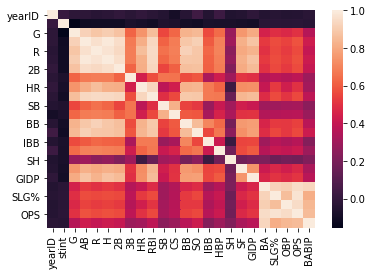

In [477]:
_ = sns.heatmap(batting_fill.corr())

It looks like the features will add some value. I may add some more later. I want to see how they correlate with Home Runs. Home Runs is a power statistic, and I want to see if any of the data in the dataset actually is highly correlated with that column. For now it looks like:
* R (runs), H (hits), and 2B (doubles) are highly correlated with Home Runs.
* It looks like BA isn't a good predictor of home runs which makes some sense. You can be a good hitter, but not hit the ball that far. I'd expect slugging percentage SLG% to have a high correlation, but it's only slightly high. 
* Perhaps visualizing some of these variables and how they correlate with home run totals could help. 

### Data Visualization with Plotly

Text(0.5, 1.0, 'Home Run Distribution')

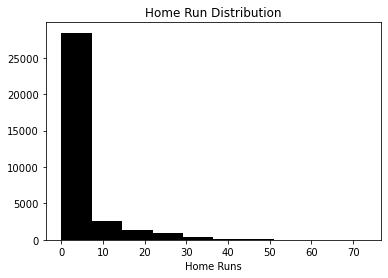

In [478]:
# Histogram of home run distributions

plt.hist(batting_fill['HR'], color = "black")
plt.xlabel('Home Runs')
plt.title('Home Run Distribution')

As you can see, finding power hitters can be quite difficult. I'm going to use plotly to create some interactive scatterplots to see how some of those metrics from before interact with Home Runs. 

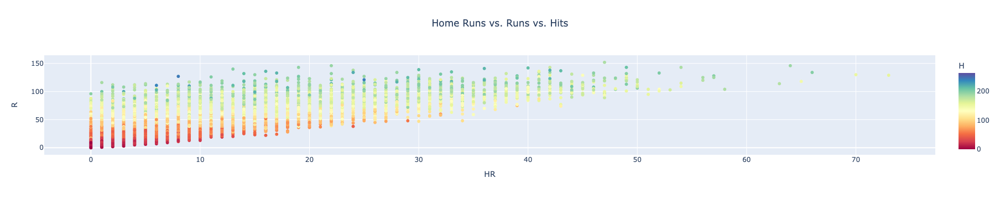

In [479]:
# Plotly Interactive Scatterplots Home Runs vs. Runs

fig = px.scatter(batting_fill, x= batting_fill['HR'], y= batting_fill['R'], color= batting_fill['H'], color_continuous_scale= 'spectral', 
                 title=" Home Runs vs. Runs vs. Hits")
fig.update_layout(
    title={ 
        'text': "Home Runs vs. Runs vs. Hits",
        'y':0.9,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'})

fig.show()

The plot above shows Home Runs in relation to runs and hits. The cooler and darker the color is, the more hits they gathered. 
1. Looking at players who hit a lot of home runs, it looks like they were in the higher end of the 150-200 hit range. 
2. Players with over 200 hits rarely hit a lot of home runs. 
3. Players who scored over 100 runs usually had a decent output for power totals. Over 20 usually.
4. I'd rate solid power as 20 home runs, good power as 30 home runs, great power as 40 + home runs, and elite power as anything over 50. 

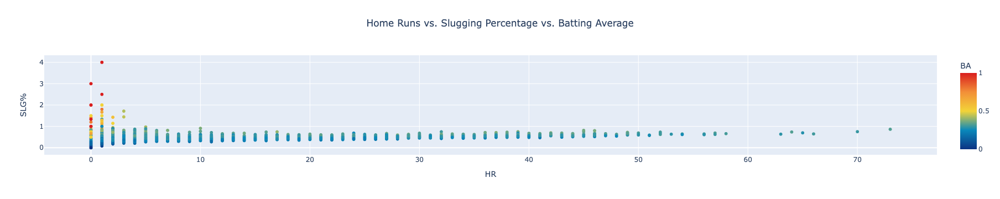

In [480]:
# Plotly Interactive Scatterplots Home Runs vs. Runs

fig = px.scatter(batting_fill, x= batting_fill['HR'], y= batting_fill['SLG%'], color= batting_fill['BA'], color_continuous_scale= 'Portland', 
                 title=" Home Runs vs. Slugging Percentage vs. Batting Average")
fig.update_layout(
    title={ 
        'text': "Home Runs vs. Slugging Percentage vs. Batting Average",
        'y':0.9,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'})

fig.show()

The first thing to notice is less amount of values on the plot. I'm wondering why this is the case. It looks like it may be related to scale of slugging percentage. It's possible that values are just clustered on top of each other because of how close each percentage point can be. The scale of the colorbar could also be what's making this information look different.

** At the moment, it looks like runs as stated before is the most closely correlated variable to home runs. Hits has some correlation, but the metrics calculated will probably be more useful in an actual machine learning algorithm.**

Next, I need to drop the ID columns so that all of the data in the dataset is numerical. 

In [481]:
batting_fill.drop(['playerID', 'stint', 'yearID', 'teamID', 'lgID'], axis = 1, inplace = True)

In [482]:
batting_fill.head()

,G,AB,R,H,2B,3B,HR,RBI,SB,CS,...,IBB,HBP,SH,SF,GIDP,BA,SLG%,OBP,OPS,BABIP
67408,32,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000
67409,33,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000
67410,7,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000
67411,91,184.0,17.0,45.0,9.0,0.0,1.0,15.0,2.0,3.0,...,1.0,2.0,2.0,1.0,3.0,0.244565,0.309783,0.282828,0.592611,0.282051
67412,59,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000


In [483]:
batting_fill.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 33924 entries, 67408 to 101331
Data columns (total 22 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   G       33924 non-null  int64  
 1   AB      33924 non-null  float64
 2   R       33924 non-null  float64
 3   H       33924 non-null  float64
 4   2B      33924 non-null  float64
 5   3B      33924 non-null  float64
 6   HR      33924 non-null  float64
 7   RBI     33924 non-null  float64
 8   SB      33924 non-null  float64
 9   CS      33924 non-null  float64
 10  BB      33924 non-null  float64
 11  SO      33924 non-null  float64
 12  IBB     33924 non-null  float64
 13  HBP     33924 non-null  float64
 14  SH      33924 non-null  float64
 15  SF      33924 non-null  float64
 16  GIDP    33924 non-null  float64
 17  BA      33924 non-null  float64
 18  SLG%    33924 non-null  float64
 19  OBP     33924 non-null  float64
 20  OPS     33924 non-null  float64
 21  BABIP   33924 non-null  float6

### Predicting Home Runs with Linear Regression and Random Forest

First thing I need to do is split the dataset. To keep it simple, I'm going to remove the home runs columns from the dataset and add it back on later. 

In [484]:
hr_batting = batting_fill.pop('HR') # remove column for HR and store it in a dataframe

In [485]:
# Add Win column to the end of the team updated dataframe

batting_fill['HR']= hr_batting # add b series as a 'new' column.
batting_fill.head()

,G,AB,R,H,2B,3B,RBI,SB,CS,BB,...,HBP,SH,SF,GIDP,BA,SLG%,OBP,OPS,BABIP,HR
67408,32,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.0
67409,33,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.0
67410,7,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.0
67411,91,184.0,17.0,45.0,9.0,0.0,15.0,2.0,3.0,9.0,...,2.0,2.0,1.0,3.0,0.244565,0.309783,0.282828,0.592611,0.282051,1.0
67412,59,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.0


In [486]:
batting_fill.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 33924 entries, 67408 to 101331
Data columns (total 22 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   G       33924 non-null  int64  
 1   AB      33924 non-null  float64
 2   R       33924 non-null  float64
 3   H       33924 non-null  float64
 4   2B      33924 non-null  float64
 5   3B      33924 non-null  float64
 6   RBI     33924 non-null  float64
 7   SB      33924 non-null  float64
 8   CS      33924 non-null  float64
 9   BB      33924 non-null  float64
 10  SO      33924 non-null  float64
 11  IBB     33924 non-null  float64
 12  HBP     33924 non-null  float64
 13  SH      33924 non-null  float64
 14  SF      33924 non-null  float64
 15  GIDP    33924 non-null  float64
 16  BA      33924 non-null  float64
 17  SLG%    33924 non-null  float64
 18  OBP     33924 non-null  float64
 19  OPS     33924 non-null  float64
 20  BABIP   33924 non-null  float64
 21  HR      33924 non-null  float6

# Home Run Binning
Before actually splitting the dataset up into certain features, I want to create a classification for a player based on the number of home runs they get. Essentially, I'm going to bin players based on their home run outputs. And classify them based on those outputs. 

In [487]:
# Creating bins for the Home Run column
def assign_hr_bins(HR):
    if HR < 10:
        return 1
    if HR >= 10 and HR < 20:
        return 2
    if HR >= 20 and HR < 30:
        return 3
    if HR >= 30 and HR < 40:
        return 4
    if HR >= 40:
        return 5
    
batting_fill['HR_bins'] = batting_fill['HR'].apply(assign_hr_bins)

In [488]:
batting_fill.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 33924 entries, 67408 to 101331
Data columns (total 23 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   G        33924 non-null  int64  
 1   AB       33924 non-null  float64
 2   R        33924 non-null  float64
 3   H        33924 non-null  float64
 4   2B       33924 non-null  float64
 5   3B       33924 non-null  float64
 6   RBI      33924 non-null  float64
 7   SB       33924 non-null  float64
 8   CS       33924 non-null  float64
 9   BB       33924 non-null  float64
 10  SO       33924 non-null  float64
 11  IBB      33924 non-null  float64
 12  HBP      33924 non-null  float64
 13  SH       33924 non-null  float64
 14  SF       33924 non-null  float64
 15  GIDP     33924 non-null  float64
 16  BA       33924 non-null  float64
 17  SLG%     33924 non-null  float64
 18  OBP      33924 non-null  float64
 19  OPS      33924 non-null  float64
 20  BABIP    33924 non-null  float64
 21  HR     

In [489]:
batting_fill.head(50)

,G,AB,R,H,2B,3B,RBI,SB,CS,BB,...,SH,SF,GIDP,BA,SLG%,OBP,OPS,BABIP,HR,HR_bins
67408,32,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,1
67409,33,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,1
67410,7,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,1
67411,91,184.0,17.0,45.0,9.0,0.0,15.0,2.0,3.0,9.0,...,2.0,1.0,3.0,0.244565,0.309783,0.282828,0.592611,0.282051,1.0,1
67412,59,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,1
67413,5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,1
67414,14,14.0,0.0,2.0,0.0,0.0,2.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.142857,0.142857,0.133333,0.276190,0.222222,0.0,1
67415,82,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,1
67416,56,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,1
67417,71,6.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.166667,0.166667,0.166667,0.333333,0.333333,0.0,1


Now that home runs are binned off. We need to factorize those bins. 

In [490]:
# HR Bins Factorize
batting_fill["HR_bins"] = pd.factorize(batting_fill.HR_bins)[0]
batting_fill.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 33924 entries, 67408 to 101331
Data columns (total 23 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   G        33924 non-null  int64  
 1   AB       33924 non-null  float64
 2   R        33924 non-null  float64
 3   H        33924 non-null  float64
 4   2B       33924 non-null  float64
 5   3B       33924 non-null  float64
 6   RBI      33924 non-null  float64
 7   SB       33924 non-null  float64
 8   CS       33924 non-null  float64
 9   BB       33924 non-null  float64
 10  SO       33924 non-null  float64
 11  IBB      33924 non-null  float64
 12  HBP      33924 non-null  float64
 13  SH       33924 non-null  float64
 14  SF       33924 non-null  float64
 15  GIDP     33924 non-null  float64
 16  BA       33924 non-null  float64
 17  SLG%     33924 non-null  float64
 18  OBP      33924 non-null  float64
 19  OPS      33924 non-null  float64
 20  BABIP    33924 non-null  float64
 21  HR     

It looks like everything worked out nicely so that we can split up the dataset. Next, I'm going to split up our variables. X will hold all of the predictor columns and y will hold the column we are going to classify on (HR_Bins).


In [491]:
# Split Features from Prediction Column
X = batting_fill.iloc[:, 0:22]
y = batting_fill.iloc[:, -1]

In [492]:
# Checking the split
X.head()

,G,AB,R,H,2B,3B,RBI,SB,CS,BB,...,HBP,SH,SF,GIDP,BA,SLG%,OBP,OPS,BABIP,HR
67408,32,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.0
67409,33,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.0
67410,7,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.0
67411,91,184.0,17.0,45.0,9.0,0.0,15.0,2.0,3.0,9.0,...,2.0,2.0,1.0,3.0,0.244565,0.309783,0.282828,0.592611,0.282051,1.0
67412,59,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.0


In [493]:
# Checking the predictor column
y.head()

67408    0
67409    0
67410    0
67411    0
67412    0
Name: HR_bins, dtype: int64

Last, I need to get all of the data on the same scale. I need to normalize the data because at the moment, metrics like batting average, slugging percentage, OBP, etc. are going to be very week in comparison to the full number statistics like home runs, runs batted in, and hits. 

### Normalizing the dataset

In [494]:
# Import Packages

from sklearn import preprocessing
scaler = preprocessing.StandardScaler()

scaler.fit(X)
X_scaled_array = scaler.transform(X)

X_scaled = pd.DataFrame(X_scaled_array, columns = X.columns)

X_scaled.head(5)

,G,AB,R,H,2B,3B,RBI,SB,CS,BB,...,HBP,SH,SF,GIDP,BA,SLG%,OBP,OPS,BABIP,HR
0,-0.402391,-0.677271,-0.606028,-0.633009,-0.604615,-0.426931,-0.584721,-0.361163,-0.427667,-0.573814,...,-0.455835,-0.493236,-0.520082,-0.587055,-1.030494,-0.985508,-1.094086,-1.068979,-1.023544,-0.482398
1,-0.380550,-0.677271,-0.606028,-0.633009,-0.604615,-0.426931,-0.584721,-0.361163,-0.427667,-0.573814,...,-0.455835,-0.493236,-0.520082,-0.587055,-1.030494,-0.985508,-1.094086,-1.068979,-1.023544,-0.482398
2,-0.948412,-0.677271,-0.606028,-0.633009,-0.604615,-0.426931,-0.584721,-0.361163,-0.427667,-0.573814,...,-0.455835,-0.493236,-0.520082,-0.587055,-1.030494,-0.985508,-1.094086,-1.068979,-1.023544,-0.482398
3,0.886219,0.343959,0.021490,0.256377,0.265957,-0.426931,-0.021780,-0.041961,0.899988,-0.134536,...,0.337463,0.331067,-0.008579,0.053369,0.651132,0.386349,0.552561,0.474382,0.551957,-0.347543
4,0.187312,-0.677271,-0.606028,-0.633009,-0.604615,-0.426931,-0.584721,-0.361163,-0.427667,-0.573814,...,-0.455835,-0.493236,-0.520082,-0.587055,-1.030494,-0.985508,-1.094086,-1.068979,-1.023544,-0.482398


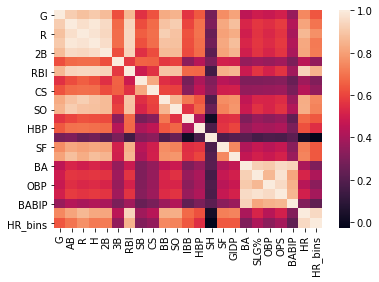

In [495]:
_ = sns.heatmap(batting_fill.corr())

With the HR column moved to the end of the dataset and the new features added it looks like the column that is strongest for predicting Home Runs actually is RBI's or (runs batted in). This makes sense because home runs at minimum equate to 1 RBI. RBI's can occur from hits, but home runs automatically equaling 1 RBI is important. We are going to classify whether a player is a power hitting or not, based on the scale mentioned before:

* Low power = 0
* Decent Power = 1
* Solid power = 2 
* Good power = 3
* Great Power = 4


In [496]:
batting_fill.head()

,G,AB,R,H,2B,3B,RBI,SB,CS,BB,...,SH,SF,GIDP,BA,SLG%,OBP,OPS,BABIP,HR,HR_bins
67408,32,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0
67409,33,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0
67410,7,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0
67411,91,184.0,17.0,45.0,9.0,0.0,15.0,2.0,3.0,9.0,...,2.0,1.0,3.0,0.244565,0.309783,0.282828,0.592611,0.282051,1.0,0
67412,59,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0


### Classifying with Logistic Regression
First, as a baseline I'll use the logistic regression classification algorithm to try and classify players into home run bins. 

In [497]:
# Defining features and targets

cols = X_scaled.columns
target_col = 'HR_bins'
feat_cols = [c for c in cols if c != target_col]

X = X_scaled[feat_cols].values
y = batting_fill[target_col].values

In [498]:
# Splittig features into test and training sets. 
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = .2, random_state = 42)

In [499]:
# Logistic Regression

log_regression = LogisticRegression() 

log_regression.fit(X_train, y_train)

Y_pred = log_regression.predict(X_test)

acc_log = round(log_regression.score(X_train, y_train) * 100, 2)

acc_log

99.62

The model is extremely accurate. The reason being is the home run bins are being predicted based on home runs at the moment. I'm going to have to remove the home run column and see how that changes results. After all, we want to see how we can predict a home run class based on other statistics. 


In [500]:
# Dropping the Home Runs columns
X_scaled.drop(['HR'], axis = 1, inplace = True)

In [501]:
X_scaled.head()

,G,AB,R,H,2B,3B,RBI,SB,CS,BB,...,IBB,HBP,SH,SF,GIDP,BA,SLG%,OBP,OPS,BABIP
0,-0.402391,-0.677271,-0.606028,-0.633009,-0.604615,-0.426931,-0.584721,-0.361163,-0.427667,-0.573814,...,-0.349034,-0.455835,-0.493236,-0.520082,-0.587055,-1.030494,-0.985508,-1.094086,-1.068979,-1.023544
1,-0.380550,-0.677271,-0.606028,-0.633009,-0.604615,-0.426931,-0.584721,-0.361163,-0.427667,-0.573814,...,-0.349034,-0.455835,-0.493236,-0.520082,-0.587055,-1.030494,-0.985508,-1.094086,-1.068979,-1.023544
2,-0.948412,-0.677271,-0.606028,-0.633009,-0.604615,-0.426931,-0.584721,-0.361163,-0.427667,-0.573814,...,-0.349034,-0.455835,-0.493236,-0.520082,-0.587055,-1.030494,-0.985508,-1.094086,-1.068979,-1.023544
3,0.886219,0.343959,0.021490,0.256377,0.265957,-0.426931,-0.021780,-0.041961,0.899988,-0.134536,...,0.022892,0.337463,0.331067,-0.008579,0.053369,0.651132,0.386349,0.552561,0.474382,0.551957
4,0.187312,-0.677271,-0.606028,-0.633009,-0.604615,-0.426931,-0.584721,-0.361163,-0.427667,-0.573814,...,-0.349034,-0.455835,-0.493236,-0.520082,-0.587055,-1.030494,-0.985508,-1.094086,-1.068979,-1.023544


### Defining Features/Target Columns

After dropping that the accuracy of the model should drop as well. Next, we are going to split the features up so that we can make predictions using the logistic regression model. 

In [502]:
# Defining features and targets

cols = X_scaled.columns
target_col = 'HR_bins'
feat_cols = [c for c in cols if c != target_col]

X = X_scaled[feat_cols].values
y = batting_fill[target_col].values

Additionally, I need to split the model up. I chose an 80-20 split as that's what I'm most familiar with when splitting into training and test sets. 

In [503]:
# Splittig features into test and training sets. 
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = .2, random_state = 42)

In [504]:
# Logistic Regression

log_regression = LogisticRegression() 

log_regression.fit(X_train, y_train)

Y_pred = log_regression.predict(X_test)

acc_log = round(log_regression.score(X_train, y_train) * 100, 2)

acc_log

94.98

In [505]:
# Accuracy Scores

from sklearn.metrics import accuracy_score
print(accuracy_score(y_test, Y_pred))

0.9472365512159174


It looks like the accuracy score of the. model is still pretty high. I'm going to use a confusion matrix to explore how the model performed across different classes. 

Text(83.40000000000006, 0.5, 'actual label')

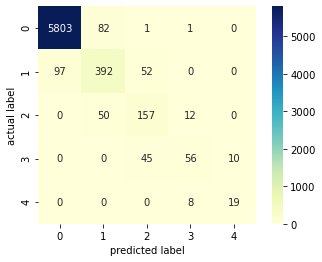

In [506]:
# Confusion Matrix
import seaborn as sns
from sklearn.metrics import confusion_matrix

matrix = confusion_matrix(y_test, Y_pred)
target_labels = np.unique(y_test)

sns.heatmap(matrix, square= True, annot= True, fmt='d', cbar = True, cmap= "YlGnBu", xticklabels = target_labels, yticklabels = target_labels)

plt.xlabel('predicted label')
plt.ylabel('actual label')

The model was extremely accurate when predicting on the 0 class because the majority of players fall into that power class. 

* In power class 1 the model was correct 392 times and misclassified players into the 0 class 97 times and the 2 class 52 times. It's precision was .75 meaning that 75% of the time it correctly classified a positive instance, recall .75 indicating a decent level of completeness, and had an f1-score .74 or 74% of positive predictions were the correct prediction.
* Power class 2 didn't have as much success. The model had a precision score .62 which indicates that at times it struggled to correctly classify a prediction. It's recall metric was .72 meaning that it correctly identified .72% of actual poisitive instances. It's f1-score was .66 which means 66% percent of the positive predictions for this class were the right prediction. 
* Power class 3 might have been the lowest performing class overall. It had a precision of .73. It's recall was .50 meaning it had trouble actually identifying this class. The f1-score for class 3 was .60 which means that of the hitters that actually belonged to this power bracket only 60% of them were identified correctly. 
* Finally the elite power class didn't have as many predictions to make, but overall it performed better than predictions made for the good power class. It had a decent precision score of .66. It's recall score was .70 indicating that it was able to identify 70% of the actual power hitters that fell into this bracket. Finally, it a f1-score of .68 meaning that 68% of players predicted to have elite power were correct predictions. 


In [507]:
# Classification Report
from sklearn.metrics import classification_report

print(classification_report(y_test, Y_pred))

              precision    recall  f1-score   support

           0       0.98      0.99      0.98      5887
           1       0.75      0.72      0.74       541
           2       0.62      0.72      0.66       219
           3       0.73      0.50      0.60       111
           4       0.66      0.70      0.68        27

    accuracy                           0.95      6785
   macro avg       0.75      0.73      0.73      6785
weighted avg       0.95      0.95      0.95      6785



Hmm, it looks like the model still performs extremely well. I want to measure how well some of the other types of classification models actually perform. Next, I'm going to use a Gaussian Naive Bayes model and the Kneighbors Classifier model along with a Random Forest. 

### K-Nearest Neighbors
Next, I wanted to see how the K-nearest Neighbors algorithm performed in comparison without any optimization. Just as a baseline. 

In [508]:
# K Nearest Neighbors

knn = KNeighborsClassifier(n_neighbors = 3)
knn.fit(X_train, y_train)
Y_pred = knn.predict(X_test)

acc_knn = round(knn.score(X_train, y_train)* 100, 2)

acc_knn

95.27

In [509]:
# K-Nearest Neighbors
print(classification_report(y_test, Y_pred))

              precision    recall  f1-score   support

           0       0.97      0.98      0.97      5887
           1       0.55      0.52      0.54       541
           2       0.39      0.44      0.42       219
           3       0.41      0.20      0.27       111
           4       0.60      0.33      0.43        27

    accuracy                           0.91      6785
   macro avg       0.58      0.50      0.52      6785
weighted avg       0.91      0.91      0.91      6785



From what I can tell, this model also performs very well. The model had a higher accuracy score. However, it performed worse in metrics like precision, recall, and f1-score indicating that it might have issues with correct classification of certain classes. After the 0 class which was the easiest class to predict on in logistic regression as well, this model drops substantially for each of the 4 four remaining classes. 

### Gaussian Bayes Model

In [510]:
gaussian = GaussianNB()
gaussian.fit(X_train, y_train)
Y_pred = gaussian.predict(X_test)
acc_gaussian = round(gaussian.score(X_train, y_train) * 100, 2)
acc_gaussian

86.47

In [511]:
# Gaussian Bayes
print(classification_report(y_test, Y_pred))

              precision    recall  f1-score   support

           0       1.00      0.89      0.94      5887
           1       0.38      0.74      0.50       541
           2       0.40      0.52      0.45       219
           3       0.48      0.53      0.50       111
           4       0.52      0.81      0.64        27

    accuracy                           0.86      6785
   macro avg       0.56      0.70      0.61      6785
weighted avg       0.92      0.86      0.88      6785



The Gaussian Bayes model in a shallow comparison is retty accuracy for the first class as with the previous models. However, similarly to K-nearest neighbors this model didn't quite perform as well as the logistic regression for the remaining classes. While the accuracy scores for the models were quite high, Logistic Regression seemed to be the most complete model as it higher scores in precision, recall, and f1-score overall for the remaining power classes. 

### Predicting wins with the Team Dataset
This dataset will be used to predict how many games a team might win based on the various statistics they accrue over the season. First, I want to filter the data frame based on information from 1990. When it comes to this information, I won't be using this data with the other datasets. This information will solely be used for win predictions on its own. I'll have to take a different approach to cleaning this data. 


In [512]:
team.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2805 entries, 0 to 2804
Data columns (total 48 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   yearID          2805 non-null   int64  
 1   lgID            2755 non-null   object 
 2   teamID          2805 non-null   object 
 3   franchID        2805 non-null   object 
 4   divID           1288 non-null   object 
 5   Rank            2805 non-null   int64  
 6   G               2805 non-null   int64  
 7   Ghome           2406 non-null   float64
 8   W               2805 non-null   int64  
 9   L               2805 non-null   int64  
 10  DivWin          1260 non-null   object 
 11  WCWin           624 non-null    object 
 12  LgWin           2777 non-null   object 
 13  WSWin           2448 non-null   object 
 14  R               2805 non-null   int64  
 15  AB              2805 non-null   int64  
 16  H               2805 non-null   int64  
 17  2B              2805 non-null   i

The sheer amount of statistical information available has quite a bit of value. Being able to predict wins based on this information should yield, some accurate results.

**I also need to make sure to filter the data to a more relevant time period for myself.**

In [513]:
team_updated = team[team['yearID'] >= 1990]
team_updated.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 758 entries, 2047 to 2804
Data columns (total 48 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   yearID          758 non-null    int64  
 1   lgID            758 non-null    object 
 2   teamID          758 non-null    object 
 3   franchID        758 non-null    object 
 4   divID           758 non-null    object 
 5   Rank            758 non-null    int64  
 6   G               758 non-null    int64  
 7   Ghome           758 non-null    float64
 8   W               758 non-null    int64  
 9   L               758 non-null    int64  
 10  DivWin          730 non-null    object 
 11  WCWin           624 non-null    object 
 12  LgWin           730 non-null    object 
 13  WSWin           730 non-null    object 
 14  R               758 non-null    int64  
 15  AB              758 non-null    int64  
 16  H               758 non-null    int64  
 17  2B              758 non-null   

In [514]:
team_updated.head()

,yearID,lgID,teamID,franchID,divID,Rank,G,Ghome,W,L,...,DP,FP,name,park,attendance,BPF,PPF,teamIDBR,teamIDlahman45,teamIDretro
2047,1990,NL,ATL,ATL,W,6,162,81.0,65,97,...,133.0,0.97,Atlanta Braves,Atlanta-Fulton County Stadium,980129.0,105,106,ATL,ATL,ATL
2048,1990,AL,BAL,BAL,E,5,161,80.0,76,85,...,151.0,0.98,Baltimore Orioles,Memorial Stadium,2415189.0,97,98,BAL,BAL,BAL
2049,1990,AL,BOS,BOS,E,1,162,81.0,88,74,...,154.0,0.98,Boston Red Sox,Fenway Park II,2528986.0,105,105,BOS,BOS,BOS
2050,1990,AL,CAL,ANA,W,4,162,81.0,80,82,...,186.0,0.97,California Angels,Anaheim Stadium,2555688.0,97,97,CAL,CAL,CAL
2051,1990,AL,CHA,CHW,W,2,162,80.0,94,68,...,169.0,0.98,Chicago White Sox,Comiskey Park,2002357.0,98,98,CHW,CHA,CHA


In [515]:
# Print the length of the team_updated date frame
print(len(team_updated)) 

758


#### Drop columns that aren't needed

This dataframe has 758 values. The first thing I notice about the data is that there are a lot of values that don't really help with predicting wins. ID columns aren't important in this case as we won't be using them to join tables with. Additionally, several other features listed below don't really help with win predictions:
* ID columns, rank, Ghome, L, DivWin, WCWin, LgW?in, WSWin, SF, name, park, attendance, BPF, PPF, teamIDBR, teamIDlahman45, teamIDretro, franchID, franchName, active, NAassoc

In [516]:
# Drop unnecessary columns
drop_team = ['lgID', 'teamID', 'franchID', 'divID', 'Ghome', 'DivWin', 'WCWin', 'LgWin', 'WSWin', 'name', 'park', 'attendance', 'BPF', 'PPF', 'teamIDBR', 'teamIDlahman45', 'teamIDretro']

# Drop function with list passed in
team_updated = team_updated.drop(drop_team, axis = 1)

# Head
team_updated.head()

,yearID,Rank,G,W,L,R,AB,H,2B,3B,...,SHO,SV,IPouts,HA,HRA,BBA,SOA,E,DP,FP
2047,1990,6,162,65,97,682,5504,1376,263,26,...,8,30,4287,1527,128,579,938,158,133.0,0.97
2048,1990,5,161,76,85,669,5410,1328,234,22,...,5,43,4305,1445,161,537,776,91,151.0,0.98
2049,1990,1,162,88,74,699,5516,1502,298,31,...,13,44,4326,1439,92,519,997,123,154.0,0.98
2050,1990,4,162,80,82,690,5570,1448,237,27,...,13,42,4362,1482,106,544,944,140,186.0,0.97
2051,1990,2,162,94,68,682,5402,1393,251,44,...,10,68,4347,1313,106,548,914,124,169.0,0.98


#### Null Value Analysis
Next, we should have a look at the kind of null values that we might have in this dataset. 



In [517]:
# Null Value function
team_null = team_updated.isna()
team_null.head()

,yearID,Rank,G,W,L,R,AB,H,2B,3B,...,SHO,SV,IPouts,HA,HRA,BBA,SOA,E,DP,FP
2047,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
2048,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
2049,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
2050,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
2051,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False


In [518]:
# Counts null features for each feature and prints them
team_null.sum()

yearID      0
Rank        0
G           0
W           0
L           0
R           0
AB          0
H           0
2B          0
3B          0
HR          0
BB          0
SO          0
SB          0
CS          0
HBP       278
SF        278
RA          0
ER          0
ERA         0
CG          0
SHO         0
SV          0
IPouts      0
HA          0
HRA         0
BBA         0
SOA         0
E           0
DP          0
FP          0
dtype: int64

It looks like we don't have many null values, only a few in the HBP SF columns. Let's calculate the percentages. 

In [519]:
# Calculate the percentage of NaN values for each feature by taking the mean * 100
team_null.mean() * 100

yearID     0.000000
Rank       0.000000
G          0.000000
W          0.000000
L          0.000000
R          0.000000
AB         0.000000
H          0.000000
2B         0.000000
3B         0.000000
HR         0.000000
BB         0.000000
SO         0.000000
SB         0.000000
CS         0.000000
HBP       36.675462
SF        36.675462
RA         0.000000
ER         0.000000
ERA        0.000000
CG         0.000000
SHO        0.000000
SV         0.000000
IPouts     0.000000
HA         0.000000
HRA        0.000000
BBA        0.000000
SOA        0.000000
E          0.000000
DP         0.000000
FP         0.000000
dtype: float64

Both of those values are over the 30 % threshold, however SF sacrifice flies directly contribute to runs are more valuable of a feature. **So**, I'll dorp HBP and impute null values for SF. 

In [520]:
### Drop HBP
team_updated = team_updated.drop(['HBP'], axis =1)

In [521]:
team_updated.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 758 entries, 2047 to 2804
Data columns (total 30 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   yearID  758 non-null    int64  
 1   Rank    758 non-null    int64  
 2   G       758 non-null    int64  
 3   W       758 non-null    int64  
 4   L       758 non-null    int64  
 5   R       758 non-null    int64  
 6   AB      758 non-null    int64  
 7   H       758 non-null    int64  
 8   2B      758 non-null    int64  
 9   3B      758 non-null    int64  
 10  HR      758 non-null    int64  
 11  BB      758 non-null    int64  
 12  SO      758 non-null    float64
 13  SB      758 non-null    float64
 14  CS      758 non-null    float64
 15  SF      480 non-null    float64
 16  RA      758 non-null    int64  
 17  ER      758 non-null    int64  
 18  ERA     758 non-null    float64
 19  CG      758 non-null    int64  
 20  SHO     758 non-null    int64  
 21  SV      758 non-null    int64  
 22

In [522]:
# Impute Null SF Values
team_updated['SF'] = team_updated['SF'].fillna(team_updated['SF'].mean())
team_updated.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 758 entries, 2047 to 2804
Data columns (total 30 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   yearID  758 non-null    int64  
 1   Rank    758 non-null    int64  
 2   G       758 non-null    int64  
 3   W       758 non-null    int64  
 4   L       758 non-null    int64  
 5   R       758 non-null    int64  
 6   AB      758 non-null    int64  
 7   H       758 non-null    int64  
 8   2B      758 non-null    int64  
 9   3B      758 non-null    int64  
 10  HR      758 non-null    int64  
 11  BB      758 non-null    int64  
 12  SO      758 non-null    float64
 13  SB      758 non-null    float64
 14  CS      758 non-null    float64
 15  SF      758 non-null    float64
 16  RA      758 non-null    int64  
 17  ER      758 non-null    int64  
 18  ERA     758 non-null    float64
 19  CG      758 non-null    int64  
 20  SHO     758 non-null    int64  
 21  SV      758 non-null    int64  
 22

### EDA through visualization

Now that the data is cleaned, we can have a look at the heatmpa to see what kind of correlation trends we have going on in the team dataset. Which features are going to be particularly valuable to predict wins on?

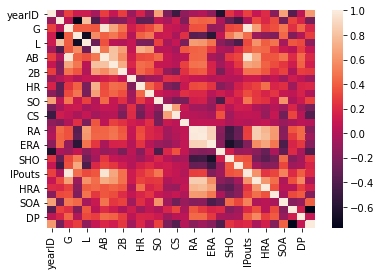

In [523]:
_ = sns.heatmap(team_updated.corr())

Based on the chart above, it looks like runs is one of the variables that is highly correlated with wins. Additional high correlation variables were: R(runs), HR(home runs), and SOA (strikeouts by pitcher). Traditionally, teams with good pitching have been winning teams. 


Next, I want to do some data visualization to see what wins look like historically.

Text(0.5, 1.0, 'Win Distribution')

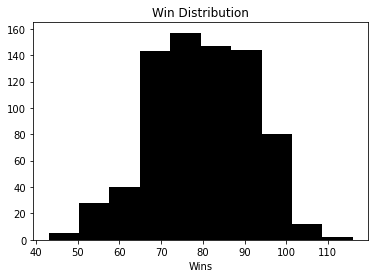

In [524]:
# Histogram of win distributions

plt.hist(team_updated['W'], color = "black")
plt.xlabel('Wins')
plt.title('Win Distribution')

We can see the most common win total is between 70-85 wins. Rarely does a team make the playoffs winning less than 80 games. A season in baseball is a marathon, 162 games, so to win half or over usually means a team played quite well. Previously, I have used scatterplots to have a closer look at the data I may be clustering. Runs, base on balls, home runs, and ERA are statistics, that I think will shed a lot of light on how many wins a team typically has. 

In [525]:
print(team_updated['W'].mean())

79.75197889182058


To further confirm the point made before, I printed out the average number of wins per year. It came out to 79.76 in the range of 70-85 I mentioned before. 

What pokes out in the dataset is the year 1994. That was the year the season ended prematurely due to the 8th working strike in MLB history. Outside of that some of the years with the highest win totals happened in 2003, 2005, and 2015. During those years, there were a fair number of teams in the 4th tier created. This tier was teams with win totals from 90 to 109 total wins. 

### Measuring Runs

A metric that might have some value is measure the number of runs for and the runs allowed per game. 

### Statistics vs. Wins

I wanted to explore some of the various statistical features of the dataset and how they correlate with wins. To do this I created colorscale scatterplots in plotly with Wins serving as the dimension for the colorscale. 

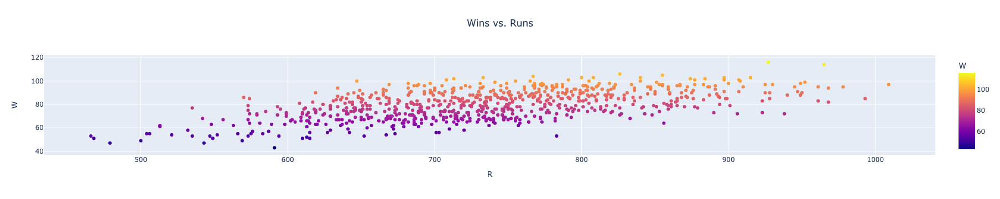

In [526]:
# Plotly Interactive Scatterplots Wins vs. Runs

fig = px.scatter(team_updated, x= team_updated['R'], y= team_updated['W'], color= team_updated['W'], 
                 title="Wins vs. Runs")
fig.update_layout(
    title={ 
        'text': "Wins vs. Runs",
        'y':0.9,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'})

fig.show()


Based on what we see in the plot above, there seems to be some correlation between teams who score a lot of runs and get a lot of wins. This would make some sense. As the team with the most amount of runs at the end of the game wins the game. Over the course of the year, the team with high run totals is probably doing well in the win column as well. 

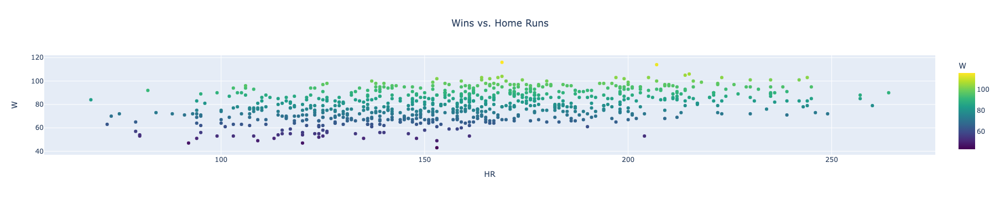

In [527]:
# Plotly Interactive Scatterplot for Wins vs. Home Runs
fig2 = px.scatter(team_updated, x= team_updated['HR'], y= team_updated['W'], color= team_updated['W'], color_continuous_scale='Viridis',
                 title="Wins vs. Home Runs")
fig2.update_layout(
    title={ 
        'text': "Wins vs. Home Runs",
        'y':0.9,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'})

fig2.show()

Looking at this one, teams who reached the 100 win threshold had less Home Runs than I expected. I figured that these teams would be close to the 100 range, but it looks like they hover in the 90's. Teams with 200 HR or more seemed to have higher win totals from the 80-100 range. I wonder how including a defensive metric like ERA would shed more light on this data.

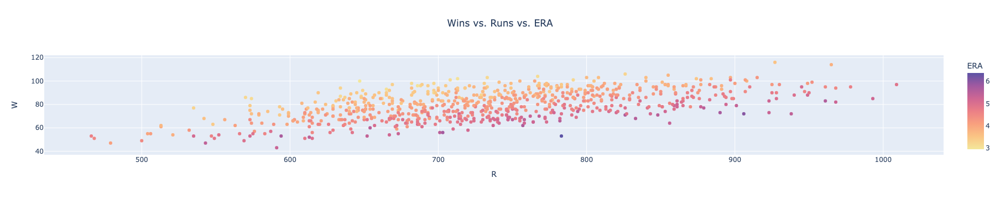

In [528]:
# Plotly Interactive Scatterplot for Wins vs. Home Runs vs. ERA
fig3 = px.scatter(team_updated, x= team_updated['R'], y= team_updated['W'], color= team_updated['ERA'], color_continuous_scale='sunset',
                 title="Wins vs. Runs vs. ERA")
fig3.update_layout(
    title={ 
        'text': "Wins vs. Runs vs. ERA",
        'y':0.9,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'})

fig3.show()

Wow! It's pretty clear from this picture that teams with a high ERA, or teams who allow a lot of runs were more likely to have a losing record. The darker colors are mostly at the bottom of this chart. Teams with lower ERA's had higher win totals. This implies that pitching has more of an impact on win totals than Home Runs. 

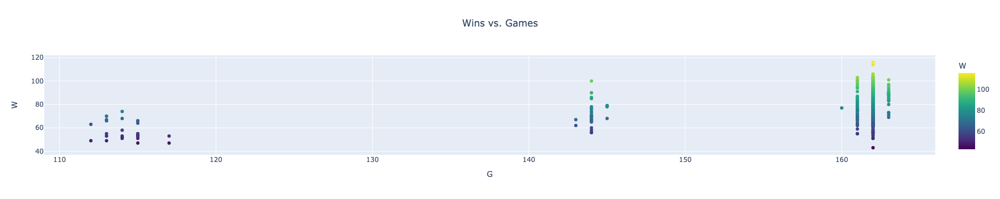

In [529]:
# Plotly Interactive Scatterplot for Wins vs. Games
fig4 = px.scatter(team_updated, x= team_updated['G'], y= team_updated['W'], color= team_updated['W'], color_continuous_scale='Viridis',
                 title="Wins vs. G")
fig4.update_layout(
    title={ 
        'text': "Wins vs. Games",
        'y':0.9,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'})

fig4.show()

As you can tell, there wasn't going to be any real correlation between these two variables. However, creating dictionaries for all of the categories deemed meaningful and turning those into per-game metrics may have some value. 

## Predicting Wins Based on the team Data

Now that we've had a chance to look at some of the team data, it's time to start building some models to predict wins. I'm going to be using several different types of models:

* KMeans
* K-Nearest Neighbors Regressor
* Random Forest Classifier

In [530]:
# Extract Win column and store it in it's own dataframe

team_up2 = team_updated.pop('W') # remove column b and store it in df1

In [531]:
# Add Win column to the end of the team updated dataframe

team_updated['W']= team_up2 # add b series as a 'new' column.
team_updated.head()

,yearID,Rank,G,L,R,AB,H,2B,3B,HR,...,SV,IPouts,HA,HRA,BBA,SOA,E,DP,FP,W
2047,1990,6,162,97,682,5504,1376,263,26,162,...,30,4287,1527,128,579,938,158,133.0,0.97,65
2048,1990,5,161,85,669,5410,1328,234,22,132,...,43,4305,1445,161,537,776,91,151.0,0.98,76
2049,1990,1,162,74,699,5516,1502,298,31,106,...,44,4326,1439,92,519,997,123,154.0,0.98,88
2050,1990,4,162,82,690,5570,1448,237,27,147,...,42,4362,1482,106,544,944,140,186.0,0.97,80
2051,1990,2,162,68,682,5402,1393,251,44,106,...,68,4347,1313,106,548,914,124,169.0,0.98,94


In [532]:
# Split the data
X = team_updated.iloc[:, 0:31]
y = team_updated.iloc[:, -1]

### Normalizing the data

Looking at these stats, I can tell that the data is going to need to be normalized. There are some columns, like AB for example that the values are too high in comparison with other columns of the dataset. Getting everythig on the same scale will significantly improve the model. 

In [533]:
# Import preprocessing

from sklearn import preprocessing
scaler = preprocessing.StandardScaler()

scaler.fit(X)
X_scaled_array = scaler.transform(X)

X_scaled = pd.DataFrame(X_scaled_array, columns = X.columns)

X_scaled.head(5)

,yearID,Rank,G,L,R,AB,H,2B,3B,HR,...,SV,IPouts,HA,HRA,BBA,SOA,E,DP,FP,W
0,-1.724473,1.884672,0.259665,1.434556,-0.569808,0.130198,-0.513411,-0.495478,-0.511037,0.052046,...,-1.358302,0.052028,0.795665,-1.096611,0.731058,-0.781933,2.773556,-0.735676,-2.337046,-1.224743
1,-1.724473,1.234726,0.154298,0.436489,-0.710174,-0.156310,-0.942688,-1.353827,-0.963172,-0.767573,...,0.328492,0.122069,0.098571,0.030922,0.150066,-1.847690,-0.811433,0.175504,-0.194989,-0.311498
2,-1.724473,-1.365058,0.259665,-0.478405,-0.386254,0.166773,0.613439,0.540461,0.054131,-1.477910,...,0.458245,0.203784,0.047564,-2.326648,-0.098931,-0.393787,0.900800,0.327368,-0.194989,0.684770
3,-1.724473,0.584780,0.259665,0.186973,-0.483430,0.331363,0.130503,-1.265032,-0.398004,-0.357764,...,0.198738,0.343867,0.413113,-1.848300,0.246898,-0.742461,1.810424,1.947245,-2.337046,0.020591
4,-1.724473,-0.715112,0.259665,-0.977438,-0.569808,-0.180694,-0.361376,-0.850656,1.523569,-1.477910,...,3.572326,0.285500,-1.023581,-1.848300,0.302230,-0.939823,0.954308,1.086685,-0.194989,1.182904


### Determine the optimum number of clusters for the K-means algorithm


In [534]:
# Import sklearn K Means
from sklearn.cluster import KMeans

# Create a list for optimal number of clusters
opt_clust = []

# Fit model for a range of 2-30 clusters and will append it to opt_clust
for n in range(2, 30):
    print('Calculating for ',n,' clusters')
    
    #Set the random state to make the result producible
    model = KMeans(n_clusters = n, random_state = 42, n_jobs = 1)
    model.fit(X_scaled)
    opt_clust.append(-model.score(X_scaled))

Calculating for  2  clusters
Calculating for  3  clusters
Calculating for  4  clusters
Calculating for  5  clusters
Calculating for  6  clusters
Calculating for  7  clusters
Calculating for  8  clusters
Calculating for  9  clusters
Calculating for  10  clusters
Calculating for  11  clusters
Calculating for  12  clusters
Calculating for  13  clusters
Calculating for  14  clusters
Calculating for  15  clusters
Calculating for  16  clusters
Calculating for  17  clusters
Calculating for  18  clusters
Calculating for  19  clusters
Calculating for  20  clusters
Calculating for  21  clusters
Calculating for  22  clusters
Calculating for  23  clusters
Calculating for  24  clusters
Calculating for  25  clusters
Calculating for  26  clusters
Calculating for  27  clusters
Calculating for  28  clusters
Calculating for  29  clusters


### Using the Elbow method to determine the optimum number of clusters
First, I'll generate a scree plot. This plot is used to detect where model quality starts to slow down. In our case it looks like a midpoint between 10-15. I'm going to say it's at 11. 

[18572.902550484076,
 15342.8296406253,
 13546.481613628563,
 12349.13556930643,
 11691.998015332005,
 11254.23041028841,
 10874.983110286146,
 10504.481085685276,
 10224.708802563546,
 9980.954591195521,
 9761.325551432285,
 9622.138304240754,
 9509.526187582938,
 9332.120683946636,
 9213.770352995838,
 9043.770135257497,
 8983.160950042538,
 8869.27099842702,
 8770.574897845861,
 8673.200872694491,
 8594.4424361308,
 8530.33657092061,
 8486.640926911126,
 8371.870381529427,
 8308.138520123344,
 8236.123548012542,
 8122.167075162429,
 8064.214059056953]

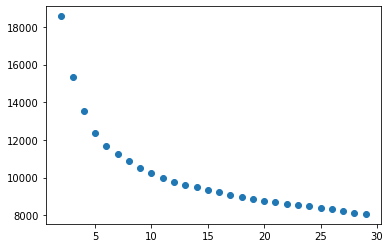

In [535]:
# Create scree plot to visualize the optimum number of clusters

plt.scatter(range(2, 30), opt_clust)
np.diff(opt_clust)
opt_clust

#### np.diff() plot

This plot is used to to further improve the decision making based on the scree plot. It calculates the difference between clusters. I'm looking for the first flat spot in the plot. It looks like the plot also flattens around 11. 

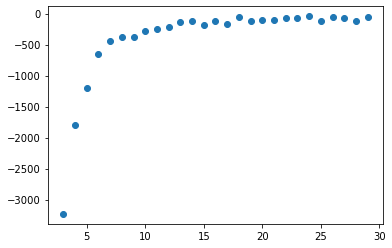

In [536]:
# Scree plot vs. np.diff plot
plt.scatter(range(3, 30), np.diff(opt_clust))

## Running the model again with the optimal number of clusters


In [537]:
#Refit model with clusters optimized
model = KMeans(n_clusters = 11, random_state= 42, n_jobs= -1)
model.fit(X_scaled)

# Collect predictions
preds = model.predict(X_scaled)

### Visualizing the Clusters

In [538]:
score = metrics.silhouette_score(X_scaled, preds)
score

0.11283019517645275

The silhouette score was quite low. Actually extremely low. I'm going to visualize this information using a PCA chart to see what the clusters actually look like and if there is any overlap. 

Text(0.5, 1.0, 'Projection of clustering on the axis of PCA')

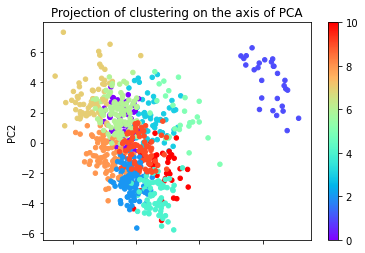

In [539]:
from sklearn.decomposition import PCA

pca = PCA(n_components=2)
data_reduced = pca.fit_transform(X_scaled)
data_reduced = pd.DataFrame(data_reduced)

ax = data_reduced.plot(kind='scatter', x = 0, y =1, c = preds, cmap='rainbow')
ax.set_xlabel('PC1')
ax.set_ylabel('PC2')
ax.set_title('Projection of clustering on the axis of PCA')

It looks like there is some clustering trying to happen, but at the same time, there's a lot of overlap. Using the PCA information provided and the silhouette score as a baseline from earlier, we can use the silhouette score to determine a better value for the optimum number of clusters. 

In [540]:
# Fit the model for range of 2-30 clusters

for n in range(2, 30):
    # Random start for reproducible results
    # n_jobs = -1 run with all processors
    model = KMeans(n_clusters = n, random_state = 42, n_jobs = -1)
    model.fit(X_scaled)
    
    #gather predictions
    preds = model.predict(X_scaled)
    score = metrics.silhouette_score(X, preds)
    
    print('Silhouette score for ',n, ' clusters: ', score)

Silhouette score for  2  clusters:  0.7898234908667836
Silhouette score for  3  clusters:  0.17264539737487875
Silhouette score for  4  clusters:  0.18132973300280172
Silhouette score for  5  clusters:  0.15279822494600523
Silhouette score for  6  clusters:  0.1344701214548308
Silhouette score for  7  clusters:  0.11550928429752681
Silhouette score for  8  clusters:  0.08494893473822426
Silhouette score for  9  clusters:  0.11201568329578987
Silhouette score for  10  clusters:  0.10351637273169197
Silhouette score for  11  clusters:  0.09847474366619074
Silhouette score for  12  clusters:  0.10374775762451482
Silhouette score for  13  clusters:  0.0820063537390603
Silhouette score for  14  clusters:  0.08228074461843092
Silhouette score for  15  clusters:  0.07518665776014691
Silhouette score for  16  clusters:  0.06105502345645081
Silhouette score for  17  clusters:  0.06968202896801265
Silhouette score for  18  clusters:  0.041440098507671594
Silhouette score for  19  clusters:  0.06

The score for 2 clusters makes a lot of sense. The reason being that we are trying to cluster based on wins and losses essentially. I'll visualize this information using the pca plot like before. It seems like 2 clusters would be the best for predicting wins and solving this problem. 


In [541]:
# Build model with 2 clusters

model = KMeans(n_clusters = 2, random_state = 42, n_jobs = -1)
model.fit(X_scaled)

# Gather predictions
preds = model.predict(X_scaled)

# Silhouette score
score = metrics.silhouette_score(X, preds)
score

0.7898234908667836

It has the same high score as before. 

Text(0.5, 1.0, 'Projection of clustering on the axis of PCA')

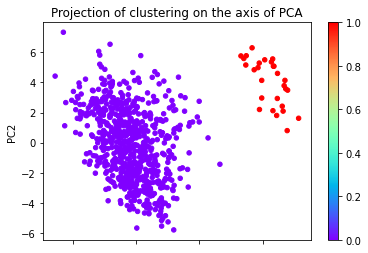

In [542]:
# Visualize with 2 clusters

pca = PCA(n_components=2)
data_reduced = pca.fit_transform(X_scaled)
data_reduced = pd.DataFrame(data_reduced)

ax = data_reduced.plot(kind='scatter', x = 0, y =1, c = preds, cmap='rainbow')
ax.set_xlabel('PC1')
ax.set_ylabel('PC2')
ax.set_title('Projection of clustering on the axis of PCA')

There's a clear division between the two clusters this time. 

### Predicting wins with K-nearest neighbors

Next, we are going to try and do something similar, but with the K-nearest neighbors regressor algorithm. 

In [543]:
# Sk Learn Imports

from sklearn.neighbors import KNeighborsRegressor
from sklearn.model_selection import train_test_split


I'm going to look at the correlation between the wins column and the rest of the dataset as a reminder. We've seen quite a few heatmaps so far. 


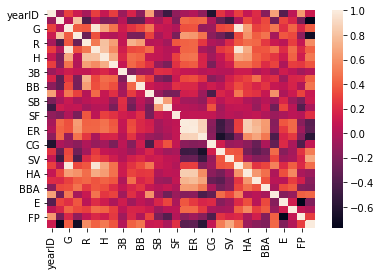

In [544]:
### Heatmap 

_ = sns.heatmap(team_updated.corr())

Wins is the last variable in the heatmap after FP. Based on what we see here, there's significant correlation on wins on variables like:

* hits, runs, home runs, base on balls and more. 

We are going to keep everything in the dataset for now. 

#### Defining features and targets

In [545]:
# Defining features and targets

cols = team_updated.columns
target_col = 'W'
feat_cols = [c for c in cols if c != target_col]

X = team_updated[feat_cols].values
y = team_updated[target_col].values

#### Splitting data into training and test sets

Next, we need to split the data into training and test sets. We need the training set to train our models on. 

In [546]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = .2, random_state = 42)

The target variable "Wins" is a continuous variable. So we will use the K Neighbors Regressor model. Since k = 2 clusters was the optimum number of clusters for the k-means model, we'll do the same here. 

In [547]:
# Define and fit the model

model = KNeighborsRegressor(n_neighbors = 2, n_jobs = -1)
model.fit(X_train, y_train)

KNeighborsRegressor(n_jobs=-1, n_neighbors=2)

In [548]:
# gather predictions made
preds = model.predict(X_test)

#display actual vs. predictions for test set

print("Actuals for test data set")
print(y_test)

print("Predictions for test data set")
print(preds)

Actuals for test data set
[ 94  68  74  94  69 104  73  47  85  94  83  90  67  94  57  93  67  80
  85  89  84  88  74  90  80  73  83  77  71  75  62  66  58  53  92  92
  72  84  62  85  63  71  87  72  98  74  77  79  94  84  57  90  96  81
  78  67  68  64  74  75  97  71  77  74  95  65  70  77  95  87  92  88
  69  76  90  68  67  77  85  77  76  82  65  69  84  63  72  78  84  93
  98  82  69  83 103  77  79  70  82  92  65  68  72  71  67  64  67  90
  88  79  86  87  71  76  86  79  75  74  67 100  56  81  81  88 103  63
  73  95  85  88  96  78  88  55  74  72 106  88  74  79  91  62  75  90
  83  71  82  90  87  75  84  66]
Predictions for test data set
[88.5 69.  75.  85.  74.5 97.5 81.5 53.5 84.5 85.5 85.5 90.  60.  96.5
 67.  90.5 69.5 71.  80.5 94.  90.5 89.5 79.5 94.  77.5 70.5 78.  77.
 73.  72.5 61.5 65.  73.5 52.5 91.5 85.5 64.5 79.  71.  78.  71.5 67.5
 94.5 82.  98.  74.  83.  84.  76.  88.5 65.  87.  91.5 86.5 76.5 71.
 64.5 71.  70.  75.  90.5 72.5 75.  77.5 90.

Next, I'm going to gather the difference between the two to see how close the model was on its predictions. 


In [549]:
# Comparing the predictions

difference = y_test - preds
print("Differences between the actual and the predictions")
print(difference)

Differences between the actual and the predictions
[  5.5  -1.   -1.    9.   -5.5   6.5  -8.5  -6.5   0.5   8.5  -2.5   0.
   7.   -2.5 -10.    2.5  -2.5   9.    4.5  -5.   -6.5  -1.5  -5.5  -4.
   2.5   2.5   5.    0.   -2.    2.5   0.5   1.  -15.5   0.5   0.5   6.5
   7.5   5.   -9.    7.   -8.5   3.5  -7.5 -10.    0.    0.   -6.   -5.
  18.   -4.5  -8.    3.    4.5  -5.5   1.5  -4.    3.5  -7.    4.    0.
   6.5  -1.5   2.   -3.5   4.5  -2.5   1.    6.    1.5   5.5  -2.5   5.
  -0.5   0.    2.    4.   -1.   -4.    1.   -1.    8.5   4.   -5.   -3.5
  -1.  -10.5  -3.   -5.5 -10.5  -1.    8.5   5.5  -3.    0.5   6.5   4.5
   8.5  -3.5  -8.   10.   -1.  -13.   -5.   -1.   -3.5   2.    5.5  -6.5
   6.   -3.5  -4.   -1.5   0.   -7.   -3.5   3.   -2.   -9.5   0.    4.
 -15.   -5.    7.5   1.    6.   -4.5   1.    6.    1.5   6.5   0.    1.5
   2.    2.5  -3.   -3.    7.5  -7.    7.5  -3.   -2.   -2.   -1.5   3.
  -2.5  -5.5   4.5   6.5  -3.  -10.5   3.5   2.5]


### Measuring the accuracy of the model. 

First, I'll have a look at the r2 score for the model. This is the coefficient of determination. The best score for this metric is 1.0. 

In [550]:
from sklearn.metrics import r2_score

print(r2_score(y_test, preds))

0.7717172893417434


This score is similar to the silhouette score we had earlier. I'm going to see if there is a better number of clusters for this model. 

In [551]:
# Empty list to store scores
scores = []
print(f'features: {feat_cols} \nTarget: {target_col}')

for k in range(2, 20):
    print(f' Evaluating {k} clusters')
    
    model = KNeighborsRegressor(n_neighbors = k, n_jobs = -1)
    model.fit(X_train, y_train)
    scores.append(model.score(X_test, y_test))
    

features: ['yearID', 'Rank', 'G', 'L', 'R', 'AB', 'H', '2B', '3B', 'HR', 'BB', 'SO', 'SB', 'CS', 'SF', 'RA', 'ER', 'ERA', 'CG', 'SHO', 'SV', 'IPouts', 'HA', 'HRA', 'BBA', 'SOA', 'E', 'DP', 'FP'] 
Target: W
 Evaluating 2 clusters
 Evaluating 3 clusters
 Evaluating 4 clusters
 Evaluating 5 clusters
 Evaluating 6 clusters
 Evaluating 7 clusters
 Evaluating 8 clusters
 Evaluating 9 clusters
 Evaluating 10 clusters
 Evaluating 11 clusters
 Evaluating 12 clusters
 Evaluating 13 clusters
 Evaluating 14 clusters
 Evaluating 15 clusters
 Evaluating 16 clusters
 Evaluating 17 clusters
 Evaluating 18 clusters
 Evaluating 19 clusters


In [552]:
scores

[0.7717172893417434,
 0.7781691016586698,
 0.7899890021025392,
 0.7914254180818372,
 0.7823141588944598,
 0.7976935573841375,
 0.7930803816917353,
 0.7832836910445407,
 0.7777456639171922,
 0.7730435812404848,
 0.7658657250166225,
 0.7659449588344448,
 0.7657607990309174,
 0.7668794680755475,
 0.7667800319424227,
 0.7705122707815323,
 0.7681161048913487,
 0.7688665526017858]

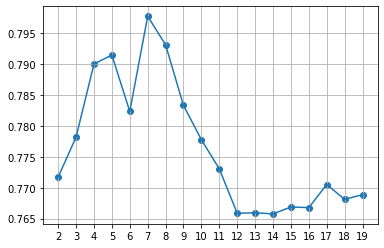

In [553]:
# Plot the results

plt.plot(range(2, 20), scores)
plt.scatter(range(2, 20), scores)
plt.grid()

_ = plt.xticks(range(2, 20))

Looking at this information, it looks like the optimum number of neighbors is 7 for this model. Now, i'm going to run the model at this number of clusters to verify this information. 

In [554]:
# define and fit the model
model = KNeighborsRegressor(n_neighbors = 7, n_jobs = -1)
model.fit(X_train, y_train)

# gather predictions
preds = model.predict(X_test)

# display actuals vs. predictions

#display actual vs. predictions for test set

print("Actuals for test data set")
print(y_test)

print("Predictions for test data set")
print(preds)


Actuals for test data set
[ 94  68  74  94  69 104  73  47  85  94  83  90  67  94  57  93  67  80
  85  89  84  88  74  90  80  73  83  77  71  75  62  66  58  53  92  92
  72  84  62  85  63  71  87  72  98  74  77  79  94  84  57  90  96  81
  78  67  68  64  74  75  97  71  77  74  95  65  70  77  95  87  92  88
  69  76  90  68  67  77  85  77  76  82  65  69  84  63  72  78  84  93
  98  82  69  83 103  77  79  70  82  92  65  68  72  71  67  64  67  90
  88  79  86  87  71  76  86  79  75  74  67 100  56  81  81  88 103  63
  73  95  85  88  96  78  88  55  74  72 106  88  74  79  91  62  75  90
  83  71  82  90  87  75  84  66]
Predictions for test data set
[91.         66.85714286 71.57142857 87.85714286 71.14285714 94.42857143
 81.85714286 52.14285714 78.         89.14285714 83.57142857 88.85714286
 65.14285714 89.42857143 64.         89.28571429 68.14285714 74.57142857
 77.71428571 90.14285714 85.57142857 88.57142857 75.28571429 92.
 77.         70.57142857 69.42857143 78.42

In [555]:
# Comparing the predictions

difference = y_test - preds
print(f'Differences between the actual and the predictions:\n {difference}')

print(f'r2_score: {r2_score(y_test, preds)}')

Differences between the actual and the predictions:
 [  3.           1.14285714   2.42857143   6.14285714  -2.14285714
   9.57142857  -8.85714286  -5.14285714   7.           4.85714286
  -0.57142857   1.14285714   1.85714286   4.57142857  -7.
   3.71428571  -1.14285714   5.42857143   7.28571429  -1.14285714
  -1.57142857  -0.57142857  -1.28571429  -2.           3.
   2.42857143  13.57142857  -1.42857143  -5.57142857   5.71428571
  -1.85714286  -1.14285714 -11.42857143  -1.85714286   5.
   7.28571429   5.57142857  -0.71428571 -13.           8.28571429
  -9.14285714  -0.42857143  -1.57142857  -6.14285714   5.42857143
  -3.42857143 -10.85714286   1.42857143  16.          -4.
 -12.28571429  -1.28571429   5.57142857  -3.85714286   4.28571429
  -5.           4.14285714  -4.42857143   1.28571429  -2.28571429
   3.71428571  -3.57142857   2.          -8.           7.14285714
  -6.          -2.57142857   2.57142857   3.           3.57142857
   2.28571429   3.28571429  -0.42857143  -1.14285714   

It looks like as we saw on the plot before. Our optimal number of clusters for this type of algorithm is at 7 with an r2 value of .797. 

#### Visualzing the Model

Next, I'm going to visualize my KNN model by using the PCA plots like I used for the Kmeans model.

In [556]:
# Visualize the model

pc = PCA()

tr_pca = pc.fit_transform(X_train)
te_pca = pc.transform(X_test)

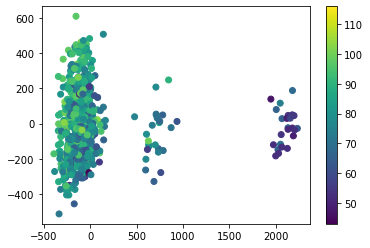

In [557]:
# Plotting the variation in the training set

_ = plt.scatter(tr_pca[:, 0], tr_pca[:, 1], c = y_train)
_ = plt.colorbar()

Looking at the variation in each set and they look very similar. The grouping looks very similar as well. 

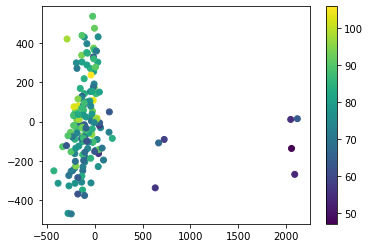

In [558]:
# Plotting the variation in the testing set
_ = plt.scatter(te_pca[:, 0], te_pca[:, 1], c = y_test)
_ = plt.colorbar()

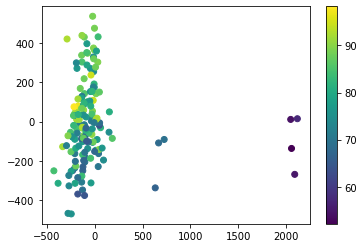

In [559]:
# Looking at the test set and cluster based on predictions made from KNN

_ = plt.scatter(te_pca[:, 0], te_pca[:, 1], c = preds)

_ = plt.colorbar()

### Normalizing for KNN
Again, it looks like there is almost no change. This time we are going to run the model with normalized data to see if we can improve from what we saw with Kmeans and the team_updated dataset, there were some features that could distort the model. 

In [560]:
# Normalize feature columns

min_max_scaler = preprocessing.MinMaxScaler()
X_tr_norm = min_max_scaler.fit_transform(X_train)
X_te_norm = min_max_scaler.fit_transform(X_test)

In [561]:
# Reconstruct the sets as dataframes to look at normalized data

new_team_tr = pd.DataFrame(X_tr_norm, columns = feat_cols)
new_team_tr['W'] = y_train
new_team_tr.head(10)

,yearID,Rank,G,L,R,AB,H,2B,3B,HR,...,SV,IPouts,HA,HRA,BBA,SOA,E,DP,FP,W
0,0.28,0.500000,0.980392,0.582278,0.605893,0.910649,0.771151,0.542056,0.10,0.416216,...,0.479167,0.911937,0.809938,0.581818,0.620968,0.560674,0.663551,0.409836,0.476190,76
1,0.08,0.000000,0.980392,0.329114,0.513812,0.795325,0.590846,0.280374,0.26,0.362162,...,0.791667,0.906067,0.580124,0.321212,0.631048,0.317978,0.663551,0.622951,0.000000,96
2,0.84,0.500000,0.980392,0.569620,0.464088,0.905974,0.712899,0.700935,0.56,0.178378,...,0.479167,0.908023,0.686957,0.430303,0.455645,0.635955,0.579439,0.360656,0.523810,77
3,0.16,0.333333,0.058824,0.265823,0.127072,0.023896,0.087379,0.252336,0.32,0.178378,...,0.187500,0.066536,0.279503,0.351515,0.135081,0.080899,0.242991,0.303279,0.476190,53
4,0.04,0.333333,0.980392,0.556962,0.300184,0.864935,0.511789,0.415888,0.44,0.194595,...,0.312500,0.937378,0.518012,0.212121,0.770161,0.480899,0.579439,0.237705,0.476190,78
5,0.08,0.833333,0.980392,0.658228,0.405157,0.854026,0.595007,0.448598,0.50,0.232432,...,0.291667,0.868885,0.568944,0.224242,0.526210,0.326966,0.719626,0.377049,0.000000,70
6,0.52,0.333333,0.980392,0.468354,0.755064,0.943377,0.855756,0.855140,0.42,0.654054,...,0.437500,0.938682,0.763975,0.812121,0.443548,0.459551,0.214953,0.459016,0.809524,85
7,0.28,0.500000,0.980392,0.620253,0.410681,0.866494,0.618585,0.514019,0.56,0.372973,...,0.395833,0.923027,0.612422,0.290909,0.500000,0.640449,0.644860,0.606557,0.476190,73
8,0.96,0.500000,0.980392,0.658228,0.300184,0.826494,0.490985,0.378505,0.16,0.475676,...,0.229167,0.889759,0.631056,0.381818,0.395161,0.648315,0.485981,0.565574,0.619048,70
9,0.60,0.000000,0.980392,0.341772,0.773481,0.918442,0.816921,0.467290,0.10,0.832432,...,0.541667,0.874103,0.703106,0.533333,0.352823,0.477528,0.383178,0.565574,0.666667,95


It looks like it worked. Now let's do the same for the test set as well. 

In [562]:
new_team_te = pd.DataFrame(X_te_norm, columns = feat_cols)
new_team_te['W'] = y_test
new_team_te.head(10)

,yearID,Rank,G,L,R,AB,H,2B,3B,HR,...,SV,IPouts,HA,HRA,BBA,SOA,E,DP,FP,W
0,0.80,0.000000,0.98,0.314815,0.613272,0.898103,0.795681,0.707071,0.617021,0.377551,...,0.500000,0.923659,0.714286,0.464968,0.000000,0.534132,0.086538,0.545455,0.944444,94
1,0.12,1.000000,0.98,0.796296,0.462243,0.884553,0.607973,0.414141,0.191489,0.459184,...,0.552632,0.922283,0.801504,0.477707,0.876106,0.313772,0.403846,0.656566,0.555556,68
2,0.40,0.500000,0.98,0.685185,0.643021,0.887805,0.774086,0.666667,0.212766,0.591837,...,0.315789,0.883769,0.795489,0.764331,0.831858,0.497006,0.451923,0.555556,0.611111,74
3,0.88,0.000000,0.98,0.314815,0.457666,0.875881,0.453488,0.449495,0.425532,0.647959,...,0.684211,0.959422,0.514286,0.414013,0.233038,0.639521,0.403846,0.393939,0.666667,94
4,0.80,0.500000,0.98,0.777778,0.304348,0.854201,0.531561,0.565657,0.170213,0.306122,...,0.342105,0.883081,0.690226,0.414013,0.557522,0.437126,0.394231,0.838384,0.666667,69
5,0.12,0.000000,0.98,0.129630,0.581236,0.869377,0.667774,0.308081,0.361702,0.515306,...,0.657895,0.928473,0.419549,0.121019,0.286136,0.519760,0.375000,0.505051,0.555556,104
6,0.08,1.000000,0.98,0.703704,0.196796,0.840108,0.500000,0.409091,0.191489,0.081633,...,0.473684,0.914030,0.578947,0.159236,0.448378,0.408383,0.673077,0.747475,0.000000,73
7,0.16,0.500000,0.04,0.314815,0.068650,0.017344,0.000000,0.000000,0.085106,0.265306,...,0.000000,0.045392,0.196992,0.433121,0.156342,0.095808,0.067308,0.141414,0.555556,47
8,0.44,0.166667,0.98,0.481481,0.590389,0.893767,0.784053,0.757576,0.553191,0.489796,...,0.631579,0.900275,0.715789,0.700637,0.182891,0.434731,0.375000,0.222222,0.666667,85
9,0.68,0.000000,0.98,0.314815,0.707094,0.890515,0.890365,0.737374,0.234043,0.280612,...,0.578947,0.887208,0.694737,0.439490,0.277286,0.663473,0.307692,0.585859,0.722222,94


#### Finding the optimum number of clusters with the normalized data


In [563]:
# Empty list to append scores to
scores_norm = []

print(f'features: {feat_cols} \nTarget: {target_col}')

for k in range(2, 20):
    print(f'Evaluating {k} clusters')
    
    model_norm = KNeighborsRegressor(n_neighbors = k, n_jobs = -1)
    model_norm.fit(X_tr_norm, y_train)
    scores_norm.append(model_norm.score(X_te_norm, y_test))

features: ['yearID', 'Rank', 'G', 'L', 'R', 'AB', 'H', '2B', '3B', 'HR', 'BB', 'SO', 'SB', 'CS', 'SF', 'RA', 'ER', 'ERA', 'CG', 'SHO', 'SV', 'IPouts', 'HA', 'HRA', 'BBA', 'SOA', 'E', 'DP', 'FP'] 
Target: W
Evaluating 2 clusters
Evaluating 3 clusters
Evaluating 4 clusters
Evaluating 5 clusters
Evaluating 6 clusters
Evaluating 7 clusters
Evaluating 8 clusters
Evaluating 9 clusters
Evaluating 10 clusters
Evaluating 11 clusters
Evaluating 12 clusters
Evaluating 13 clusters
Evaluating 14 clusters
Evaluating 15 clusters
Evaluating 16 clusters
Evaluating 17 clusters
Evaluating 18 clusters
Evaluating 19 clusters


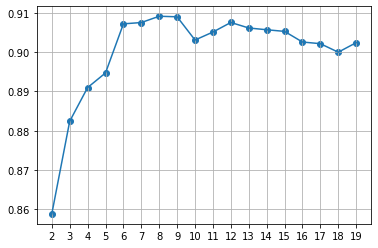

In [564]:
# display normalized model
plt.plot(range(2, 20), scores_norm)
plt.scatter(range(2, 20), scores_norm)
plt.grid()

_ = plt.xticks(range(2, 20))

It looks like the the highest scores are when the model is set at 8 clusters. Let's have a look by running it at that level. 

In [565]:
# define and fit the model with k = 8

model_norm = KNeighborsRegressor(n_neighbors = 8, n_jobs = -1)
model_norm.fit(X_tr_norm, y_train)

# gather predictions
preds_norm = model_norm.predict(X_te_norm)

# display the actuals and predictions
print('Actuals for test data set')
print(y_test)

print('Predictions for test data set')
print(preds_norm)

Actuals for test data set
[ 94  68  74  94  69 104  73  47  85  94  83  90  67  94  57  93  67  80
  85  89  84  88  74  90  80  73  83  77  71  75  62  66  58  53  92  92
  72  84  62  85  63  71  87  72  98  74  77  79  94  84  57  90  96  81
  78  67  68  64  74  75  97  71  77  74  95  65  70  77  95  87  92  88
  69  76  90  68  67  77  85  77  76  82  65  69  84  63  72  78  84  93
  98  82  69  83 103  77  79  70  82  92  65  68  72  71  67  64  67  90
  88  79  86  87  71  76  86  79  75  74  67 100  56  81  81  88 103  63
  73  95  85  88  96  78  88  55  74  72 106  88  74  79  91  62  75  90
  83  71  82  90  87  75  84  66]
Predictions for test data set
[ 93.25   68.75   72.125  95.125  67.75   97.25   77.375  52.875  84.875
  96.5    83.625  93.75   65.5    93.75   58.     89.375  63.875  84.
  85.5    91.875  87.     90.875  72.25   89.875  78.     71.75   74.625
  76.75   71.     68.     67.25   66.375  65.125  53.875  91.125  92.625
  69.375  84.875  75.25   79.5    66.

In [566]:
# Calculating the difference between the actual and the predictions
difference_norm = y_test - preds_norm

print(f'Differences between the two sets:\n{difference_norm}')
print(f'r2_score: {r2_score(y_test, preds_norm)}')

Differences between the two sets:
[  0.75   -0.75    1.875  -1.125   1.25    6.75   -4.375  -5.875   0.125
  -2.5    -0.625  -3.75    1.5     0.25   -1.      3.625   3.125  -4.
  -0.5    -2.875  -3.     -2.875   1.75    0.125   2.      1.25    8.375
   0.25    0.      7.     -5.25   -0.375  -7.125  -0.875   0.875  -0.625
   2.625  -0.875 -13.25    5.5    -3.625   0.875  -1.625  -3.      3.25
   0.125  -6.875  -1.      1.375  -6.25  -11.375  -2.875   4.25   -2.375
   1.     -0.75    2.     -5.125   1.375  -0.75    2.     -3.375  -2.375
  -2.875   2.625  -6.      0.      4.      2.     -1.      1.5    -4.625
   2.25   -0.75    1.     -1.75   -1.875   3.625   2.875  -0.125  -2.5
  -1.625  -2.375  -1.875  -2.625  -9.5    -2.375  -0.25   -3.25   -4.375
   2.375   0.875   1.375   1.      6.375   0.625   1.125  -3.625  -4.625
  -2.     -0.75    0.625  -1.25    0.625   1.75    5.875   3.5    -3.125
  -4.     -0.5     1.625  -2.     -5.875  -6.125  -3.75    1.875   1.625
   1.375   0.875   6.25

Comparing the two sets:

* Original set = .797
* Normalized data model = .909

That's a significant improvement and a high-performing model. Last, we are going to have a look at how the Random Forest Regressor algorithm does in comparison to the previous 2 models. 

### Random Forest Regression

Random Forest has a classifier model that I want to test against K-means and KNN. 

In [567]:
# Import Random Forest

from sklearn.ensemble import RandomForestClassifier

rfr = RandomForestClassifier(n_estimators = 500, random_state = 42)
rfr.fit(X_tr_norm, y_train)

# Gather predictions

rfr_preds = rfr.predict(X_te_norm)
rfr_preds


# display the actuals and predictions
print('Actuals for test data set')
print(y_test)

print('Predictions for test data set')
print(rfr_preds)

Actuals for test data set
[ 94  68  74  94  69 104  73  47  85  94  83  90  67  94  57  93  67  80
  85  89  84  88  74  90  80  73  83  77  71  75  62  66  58  53  92  92
  72  84  62  85  63  71  87  72  98  74  77  79  94  84  57  90  96  81
  78  67  68  64  74  75  97  71  77  74  95  65  70  77  95  87  92  88
  69  76  90  68  67  77  85  77  76  82  65  69  84  63  72  78  84  93
  98  82  69  83 103  77  79  70  82  92  65  68  72  71  67  64  67  90
  88  79  86  87  71  76  86  79  75  74  67 100  56  81  81  88 103  63
  73  95  85  88  96  78  88  55  74  72 106  88  74  79  91  62  75  90
  83  71  82  90  87  75  84  66]
Predictions for test data set
[ 97  65  68  96  67 103  72  53  83  97  76  90  65  96  55  95  65  79
  84  90  83  88  68  85  76  65  80  75  63  70  68  63  70  53  89  95
  67  83  73  83  65  68  86  65  96  67  72  76  97  83  63  91  98  83
  79  67  67  68  68  71  96  67  75  79  95  68  72  72  93  88  94  88
  65  75  89  67  67  72  84  76  

In [568]:
# Calculating the difference between the actual and the predictions
difference_rfr = y_test - rfr_preds

print(f'Differences between the two sets:\n{difference_rfr}')
print(f'r2_score: {r2_score(y_test, rfr_preds)}')

Differences between the two sets:
[ -3   3   6  -2   2   1   1  -6   2  -3   7   0   2  -2   2  -2   2   1
   1  -1   1   0   6   5   4   8   3   2   8   5  -6   3 -12   0   3  -3
   5   1 -11   2  -2   3   1   7   2   7   5   3  -3   1  -6  -1  -2  -2
  -1   0   1  -4   6   4   1   4   2  -5   0  -3  -2   5   2  -1  -2   0
   4   1   1   1   0   5   1   1   5  -1   0   2   1  -9  -3   4   1  -2
   1   6   2   3   1   6  -1  -2   1  -4  -2   0   5   4   0   9   3  -6
   0   4   1   1  -1   1   1   4   8   6   0   3 -11   2   2  -1   2  -2
   6  -5   1   0  -4  -1   0   6   7   0   6   0   6   5  -2  11   6  -1
   3   5   3  -1   1   4   1  -1]
r2_score: 0.8823431990942907


This model doesn't quite perform as well as the KNN Regressor model. R2 assesses the accuracy of the model. I used r2 for the model despite it not being a good measure for classification because I'm trying to predict an actual output and not a class. It still scores a .88. I wanted to see how the classifier model performed in comparison to the model. It performed at .88 in comparison to the .78 for the K means model. The highest performing model was:

1. **KNN with normalized data = 0.91**
2. Random Forest Classifier = .88
3. KNN not normalized = .79
4. KMeans = .78

## Conclusions

### Part 1:
The first problem which was a multi-class classification problem was solved using a binning technique to bin players based on home-run outputs and trying to predict which kind of power class they belonged to. Through the EDA process for that part of the project I identified that the following statistics were highly correlated to Home Runs:
* Hits, Doubles, and Runs. Runs was the most obvious, but hits indicates a need for consistent contact with the ball, while doubles indicates that a player has the capability to drive the ball for extra-base hits which a home run is. These variables and their relationships with home runs were further explored using plotly and there was some clear correlations. 
* The highest performing model for this multi-class classification problem was the inital model Logistic Regression with normalized data. The data was normalized for the other models as well, but logistic regression had the higher overall scores in precision, recall, and the f1-score. It had an accuracy score of 94.7. 

### Part 2:
This problem was continuous prediction problem. We were trying to predict win totals. In my initial EDA of the data for the team dataset I noticed the following were highly correlated with Wins:
* Runs, Home Runs, and SOA or strikeouts by a pitcher. This indicates the important of scoring a fair amount of runs, but the strongest correlated variable was strikeouts by pitcher. Meaning that teams not dominant pitchers who can generate a lot of strikeouts to win games. These variables were explored further with the plotly chart and it was confirmed that when teams had high run totals along with strong pitching metrics, they had higher win totals. 
* Then I proceeded to build several models which included:
    * KMeans
    * KNN 
    * Random Forest
OF those models, the model with the highest r2 score was the normalized KNN model with an r2 score of .91. 

### Closing thoughts/Reviews

Late in the process I found a website with more current data that I could have used. I opted to stick with my data and plan. However, my initial plan did change quite a bit as I ended up not being able to figure out whether or not a player is a hall of fame or all-star caliber player. Failure to solve that question from earlier in the process resulted from inexperience with SQL and I know that is an area I'd like to focus on for my next practicum project. 